<a href="https://colab.research.google.com/github/benjipeng/ML-open/blob/main/VAE_Torch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Design and implement a VAE using PyTorch

## Familiarize with PyTorch and Dataset

In [1]:
!nvidia-smi # not found if no GPU

/bin/bash: line 1: nvidia-smi: command not found


In [2]:
import torch

In [8]:
if torch.cuda.is_available():
    print(torch.cuda.get_device_name(0))
else:
    print(torch.cuda.is_available())

False


In [11]:
from torch.utils.data import DataLoader
import torchvision
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np

In [49]:
def visualize_cifar10_samples(dataset, num_samples=16):
    """
    Visualizes a grid of images from the CIFAR-10 dataset.

    Args:
        dataset: PyTorch dataset object.
        num_samples (int): Number of samples to visualize (default: 16).
    """
    # Create a DataLoader to fetch a batch of data
    loader = DataLoader(dataset, batch_size=num_samples, shuffle=True)
    data_iter = iter(loader)
    images, labels = next(data_iter)

    # Create a grid of images
    grid_img = torchvision.utils.make_grid(images, nrow=4, padding=2)
    npimg = grid_img.numpy()
    plt.figure(figsize=(8,8))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title('CIFAR-10 Samples')
    plt.axis('off')
    plt.show()

In [12]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

In [13]:
# the CIFAR10 is from dataset in torchvision
train_dataset = datasets.CIFAR10(root="./data", train=True, download=True, transform=transform)

100%|██████████| 170498071/170498071 [00:01<00:00, 102630549.66it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data


In [26]:
cifar10_loader = DataLoader(train_dataset)
cifar10_iter = iter(cifar10_loader)

In [45]:
image_tensor, label = next(cifar10_iter)

In [46]:
image = image_tensor.numpy()

In [47]:
np.transpose(image[0], (1,2,0)).shape

(32, 32, 3)

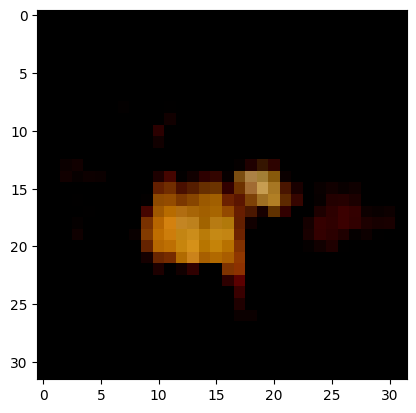

In [48]:
plt.imshow(np.transpose(image[0], (1,2,0)))

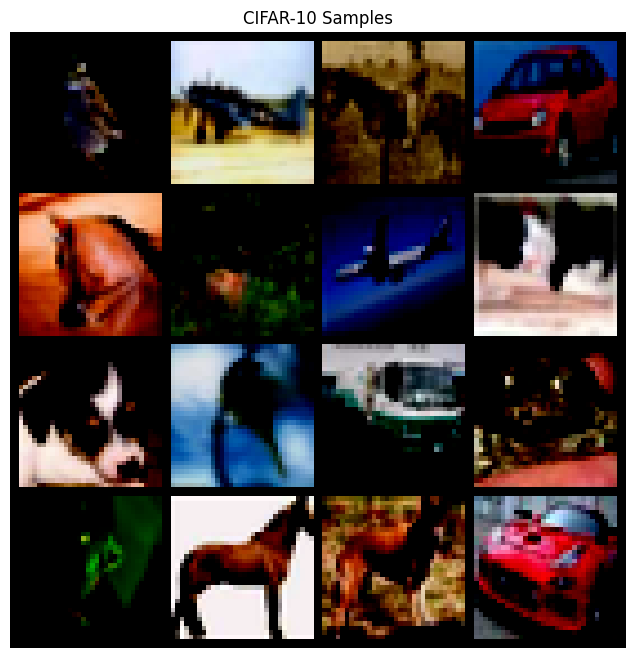

In [51]:
visualize_cifar10_samples(train_dataset, num_samples=16)

In [1]:
# Import necessary libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np


In [2]:
# Configuration dictionary for easy parameter management
config = {
    'batch_size': 128,
    'learning_rate': 1e-3,
    'num_epochs': 50,
    'latent_dim': 128,
    'image_size': 32,
    'image_channels': 3,
    'device': torch.device('cuda' if torch.cuda.is_available() else 'cpu'),
    'seed': 42,
}


In [3]:
config

{'batch_size': 128,
 'learning_rate': 0.001,
 'num_epochs': 50,
 'latent_dim': 128,
 'image_size': 32,
 'image_channels': 3,
 'device': device(type='cuda'),
 'seed': 42}

Files already downloaded and verified


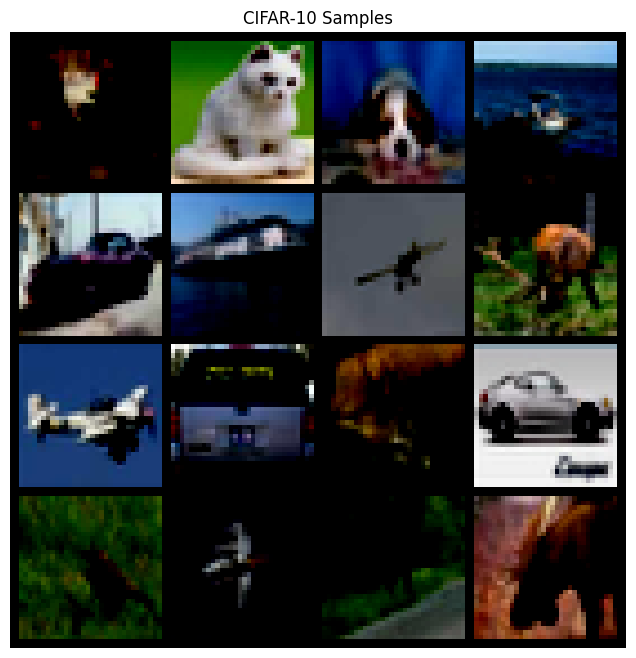

In [5]:
def visualize_cifar10_samples(dataset, num_samples=16):
    """
    Visualizes a grid of images from the CIFAR-10 dataset.

    Args:
        dataset: PyTorch dataset object.
        num_samples (int): Number of samples to visualize (default: 16).
    """
    # Create a DataLoader to fetch a batch of data
    loader = DataLoader(dataset, batch_size=num_samples, shuffle=True)
    data_iter = iter(loader)
    images, labels = next(data_iter)

    # Create a grid of images
    grid_img = torchvision.utils.make_grid(images, nrow=4, padding=2)
    npimg = grid_img.numpy()
    plt.figure(figsize=(8,8))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title('CIFAR-10 Samples')
    plt.axis('off')
    plt.show()

# Define transformations for the dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    # Normalize CIFAR-10 images to [-1, 1]
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

# Load the CIFAR-10 training dataset
train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)

# Visualize samples
visualize_cifar10_samples(train_dataset, num_samples=16)


In [6]:
class Encoder(nn.Module):
    def __init__(self, image_channels, latent_dim):
        """
        Encoder part of the VAE.

        Args:
            image_channels (int): Number of channels in the input image.
            latent_dim (int): Dimensionality of the latent space.
        """
        super(Encoder, self).__init__()
        self.latent_dim = latent_dim
        # Define convolutional layers
        self.conv = nn.Sequential(
            nn.Conv2d(image_channels, 32, kernel_size=4, stride=2, padding=1),  # 16x16
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),             # 8x8
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),            # 4x4
            nn.ReLU(),
            nn.Flatten()
        )
        # Calculate the size after convolutions to define the linear layers
        self.fc_mu = nn.Linear(128 * 4 * 4, latent_dim)
        self.fc_logvar = nn.Linear(128 * 4 * 4, latent_dim)

    def forward(self, x):
        x = self.conv(x)
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar

class Decoder(nn.Module):
    def __init__(self, latent_dim, image_channels):
        """
        Decoder part of the VAE.

        Args:
            latent_dim (int): Dimensionality of the latent space.
            image_channels (int): Number of channels in the output image.
        """
        super(Decoder, self).__init__()
        self.fc = nn.Linear(latent_dim, 128 * 4 * 4)
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # 8x8
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),   # 16x16
            nn.ReLU(),
            nn.ConvTranspose2d(32, image_channels, kernel_size=4, stride=2, padding=1),  # 32x32
            nn.Tanh()  # Output in range [-1, 1]
        )

    def forward(self, z):
        z = self.fc(z)
        z = z.view(-1, 128, 4, 4)
        x_recon = self.deconv(z)
        return x_recon

class VAE(nn.Module):
    def __init__(self, image_channels=3, latent_dim=128):
        """
        Variational Autoencoder combining the Encoder and Decoder.

        Args:
            image_channels (int): Number of channels in the input/output image.
            latent_dim (int): Dimensionality of the latent space.
        """
        super(VAE, self).__init__()
        self.encoder = Encoder(image_channels, latent_dim)
        self.decoder = Decoder(latent_dim, image_channels)

    def reparameterize(self, mu, logvar):
        """
        Applies the reparameterization trick to sample from the latent distribution.

        Args:
            mu (Tensor): Mean of the latent distribution.
            logvar (Tensor): Log variance of the latent distribution.

        Returns:
            Tensor: Sampled latent vector.
        """
        std = torch.exp(0.5 * logvar)  # Calculate standard deviation
        eps = torch.randn_like(std)    # Sample epsilon from standard normal
        return mu + std * eps          # Reparameterize

    def forward(self, x):
        """
        Forward pass through the VAE.

        Args:
            x (Tensor): Input image tensor.

        Returns:
            Tuple[Tensor, Tensor, Tensor]: Reconstructed image, mu, logvar.
        """
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        x_recon = self.decoder(z)
        return x_recon, mu, logvar


In [7]:
def loss_function(recon_x, x, mu, logvar):
    """
    Computes the VAE loss function as the sum of reconstruction loss and KL divergence.

    Args:
        recon_x (Tensor): Reconstructed image.
        x (Tensor): Original input image.
        mu (Tensor): Mean from the encoder's latent space.
        logvar (Tensor): Log variance from the encoder's latent space.

    Returns:
        Tuple[Tensor, Tensor, Tensor]: Total loss, reconstruction loss, KL divergence.
    """
    # Reconstruction loss using Binary Cross Entropy
    # Since images are normalized to [-1, 1], adjust the loss accordingly
    # Alternatively, use MSE loss
    BCE = nn.functional.mse_loss(recon_x, x, reduction='sum')

    # KL Divergence
    # Using the closed-form expression for KL divergence between two Gaussians
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    # Total loss
    loss = BCE + KLD
    return loss, BCE, KLD


In [8]:
def train_vae(model, dataloader, optimizer, epoch, config):
    """
    Trains the VAE for one epoch.

    Args:
        model (nn.Module): The VAE model.
        dataloader (DataLoader): DataLoader for training data.
        optimizer (Optimizer): Optimizer for training.
        epoch (int): Current epoch number.
        config (dict): Configuration dictionary.

    Returns:
        Tuple[float, float, float]: Average total loss, reconstruction loss, KL divergence.
    """
    model.train()
    train_loss = 0
    train_recon_loss = 0
    train_KLD = 0

    for batch_idx, (data, _) in enumerate(dataloader):
        data = data.to(config['device'])
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(data)
        loss, BCE, KLD = loss_function(recon_batch, data, mu, logvar)
        loss.backward()
        train_loss += loss.item()
        train_recon_loss += BCE.item()
        train_KLD += KLD.item()
        optimizer.step()

        if batch_idx % 100 == 0:
            print(f"Epoch [{epoch}/{config['num_epochs']}], Batch [{batch_idx}/{len(dataloader)}], Loss: {loss.item() / len(data):.4f}")

    avg_loss = train_loss / len(dataloader.dataset)
    avg_recon = train_recon_loss / len(dataloader.dataset)
    avg_KLD = train_KLD / len(dataloader.dataset)

    print(f"====> Epoch: {epoch} Average loss: {avg_loss:.4f}, Recon Loss: {avg_recon:.4f}, KLD: {avg_KLD:.4f}")
    return avg_loss, avg_recon, avg_KLD


In [9]:
def visualize_reconstructions(model, dataloader, config, epoch, num_images=16):
    """
    Visualizes original and reconstructed images.

    Args:
        model (nn.Module): The VAE model.
        dataloader (DataLoader): DataLoader for validation/test data.
        config (dict): Configuration dictionary.
        epoch (int): Current epoch number.
        num_images (int): Number of images to display.
    """
    model.eval()
    with torch.no_grad():
        data, _ = next(iter(dataloader))
        data = data.to(config['device'])[:num_images]
        recon, _, _ = model(data)

        # Move tensors to CPU and denormalize
        data = data.cpu() * 0.5 + 0.5
        recon = recon.cpu() * 0.5 + 0.5

        # Create a grid for original images
        orig_grid = torchvision.utils.make_grid(data, nrow=4, padding=2)
        # Create a grid for reconstructed images
        recon_grid = torchvision.utils.make_grid(recon, nrow=4, padding=2)

        # Plot side by side
        fig, axes = plt.subplots(1, 2, figsize=(12,6))
        axes[0].imshow(np.transpose(orig_grid.numpy(), (1, 2, 0)))
        axes[0].set_title('Original Images')
        axes[0].axis('off')

        axes[1].imshow(np.transpose(recon_grid.numpy(), (1, 2, 0)))
        axes[1].set_title('Reconstructed Images')
        axes[1].axis('off')

        plt.suptitle(f'Epoch {epoch}')
        plt.show()

def visualize_generated_samples(model, config, epoch, num_samples=16):
    """
    Generates and visualizes new samples from the latent space.

    Args:
        model (nn.Module): The VAE model.
        config (dict): Configuration dictionary.
        epoch (int): Current epoch number.
        num_samples (int): Number of samples to generate.
    """
    model.eval()
    with torch.no_grad():
        # Sample from standard normal distribution
        z = torch.randn(num_samples, config['latent_dim']).to(config['device'])
        samples = model.decoder(z)
        samples = samples.cpu() * 0.5 + 0.5  # Denormalize

        # Create a grid of generated images
        grid_img = torchvision.utils.make_grid(samples, nrow=4, padding=2)
        npimg = grid_img.numpy()
        plt.figure(figsize=(8,8))
        plt.imshow(np.transpose(npimg, (1, 2, 0)))
        plt.title(f'Generated Samples at Epoch {epoch}')
        plt.axis('off')
        plt.show()


In [10]:
torch.cuda.get_device_name(0)

'Tesla T4'

In [11]:
model = VAE(image_channels=config['image_channels'], latent_dim=config['latent_dim']).to(config['device'])
print(model)

VAE(
  (encoder): Encoder(
    (conv): Sequential(
      (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): ReLU()
      (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (3): ReLU()
      (4): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (5): ReLU()
      (6): Flatten(start_dim=1, end_dim=-1)
    )
    (fc_mu): Linear(in_features=2048, out_features=128, bias=True)
    (fc_logvar): Linear(in_features=2048, out_features=128, bias=True)
  )
  (decoder): Decoder(
    (fc): Linear(in_features=128, out_features=2048, bias=True)
    (deconv): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): ReLU()
      (2): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (3): ReLU()
      (4): ConvTranspose2d(32, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (5): Tanh()
    )
  )
)


In [12]:
# Define optimizer
optimizer = optim.Adam(model.parameters(), lr=config['learning_rate'])

# Lists to store loss history
loss_history = []
recon_history = []
KLD_history = []

In [15]:
# Load the CIFAR-10 training and test datasets
train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)


Files already downloaded and verified
Files already downloaded and verified


In [16]:
train_loader = DataLoader(train_dataset, batch_size=config['batch_size'], shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=config['batch_size'], shuffle=False, num_workers=2)

Epoch [1/50], Batch [0/391], Loss: 835.9256
Epoch [1/50], Batch [100/391], Loss: 340.5427
Epoch [1/50], Batch [200/391], Loss: 284.7904
Epoch [1/50], Batch [300/391], Loss: 263.2763
====> Epoch: 1 Average loss: 345.8271, Recon Loss: 303.7346, KLD: 42.0925


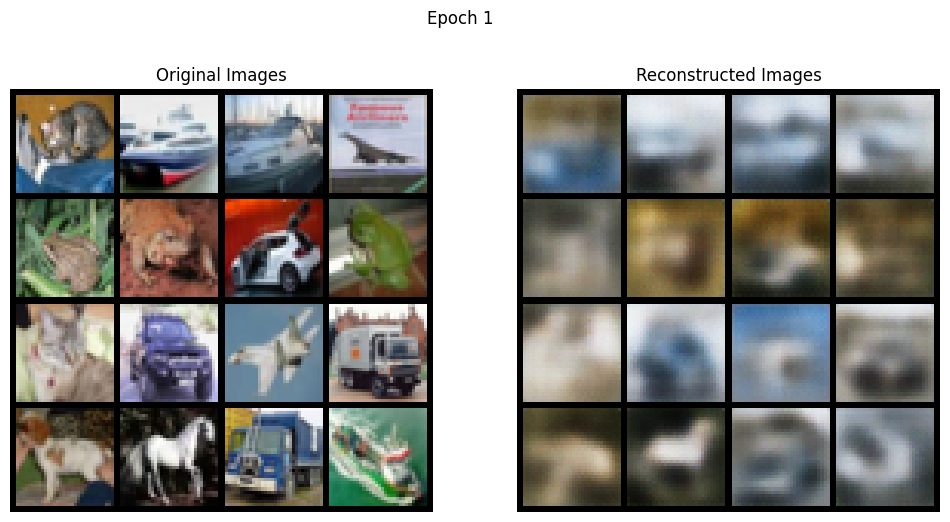

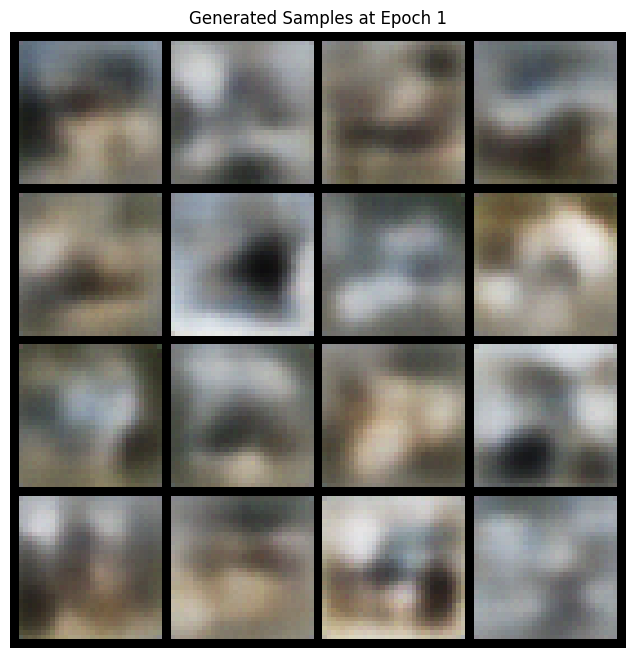

Epoch [2/50], Batch [0/391], Loss: 254.5085
Epoch [2/50], Batch [100/391], Loss: 231.6487
Epoch [2/50], Batch [200/391], Loss: 214.2752
Epoch [2/50], Batch [300/391], Loss: 220.5882
====> Epoch: 2 Average loss: 225.5710, Recon Loss: 174.3483, KLD: 51.2226


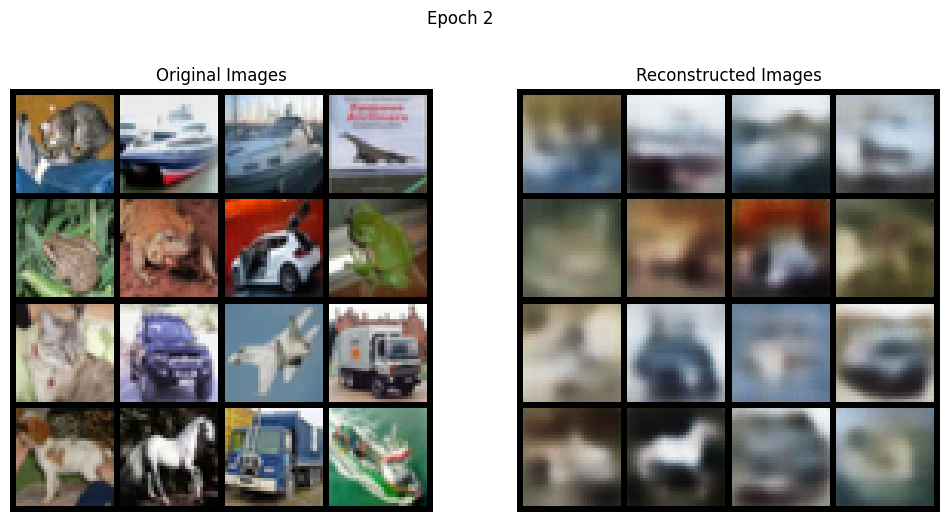

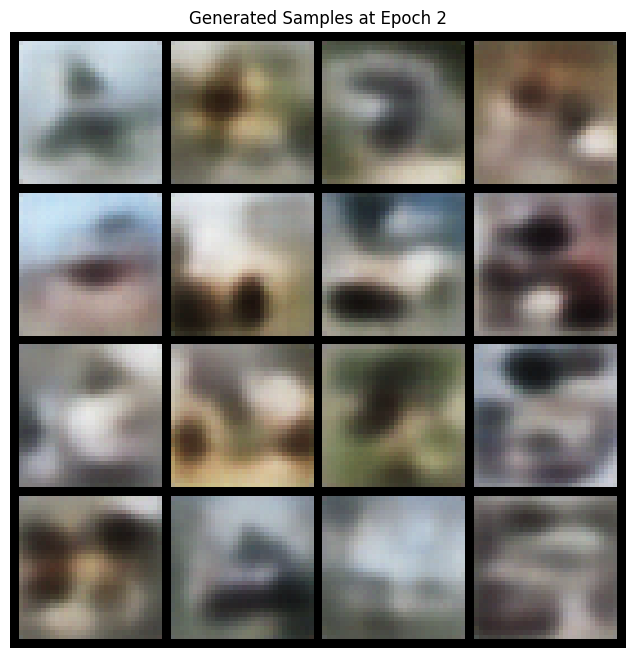

Epoch [3/50], Batch [0/391], Loss: 211.2881
Epoch [3/50], Batch [100/391], Loss: 216.5815
Epoch [3/50], Batch [200/391], Loss: 213.8864
Epoch [3/50], Batch [300/391], Loss: 202.7134
====> Epoch: 3 Average loss: 208.3311, Recon Loss: 154.2048, KLD: 54.1263


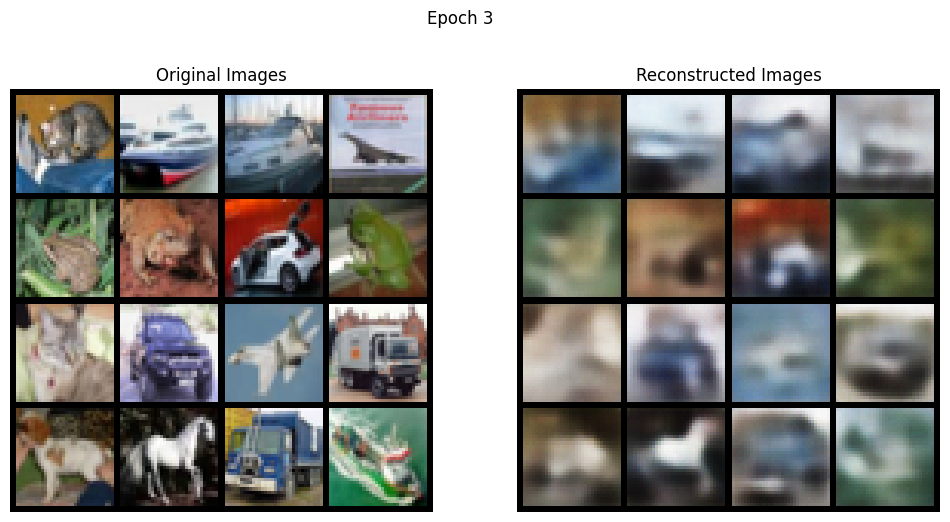

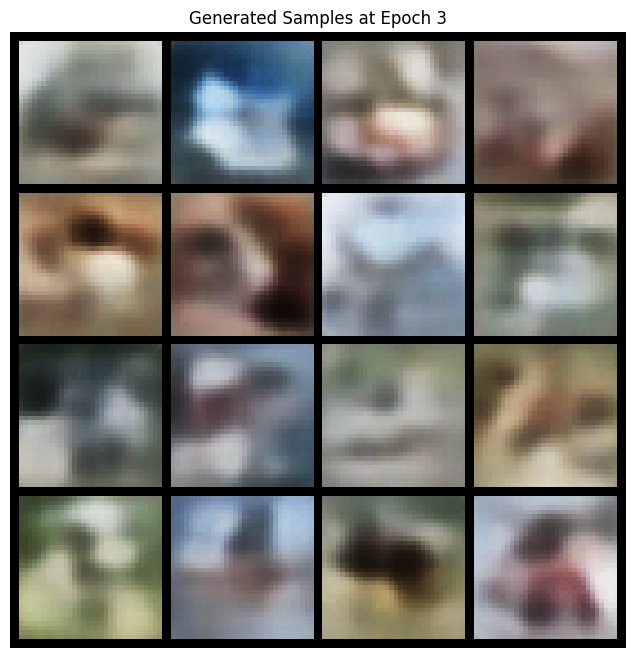

Epoch [4/50], Batch [0/391], Loss: 201.6317
Epoch [4/50], Batch [100/391], Loss: 196.7302
Epoch [4/50], Batch [200/391], Loss: 202.0714
Epoch [4/50], Batch [300/391], Loss: 207.8396
====> Epoch: 4 Average loss: 201.5608, Recon Loss: 145.0196, KLD: 56.5412


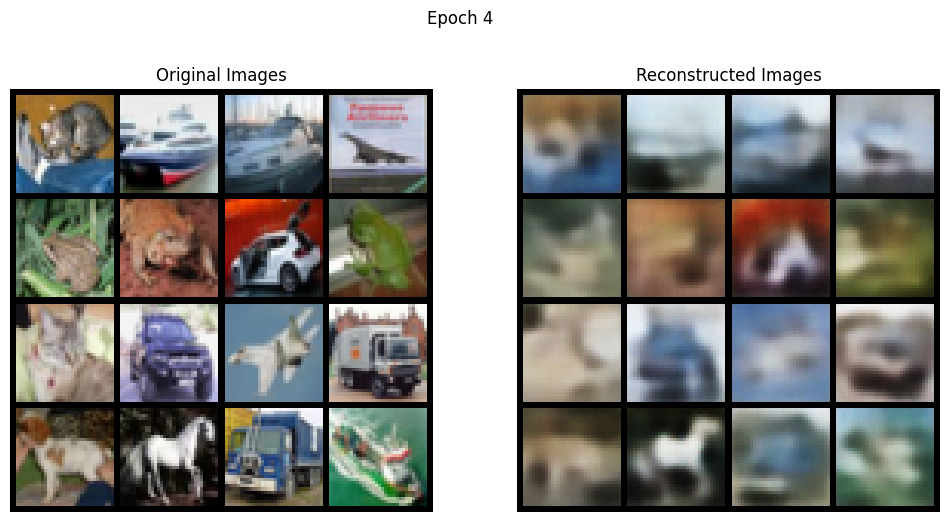

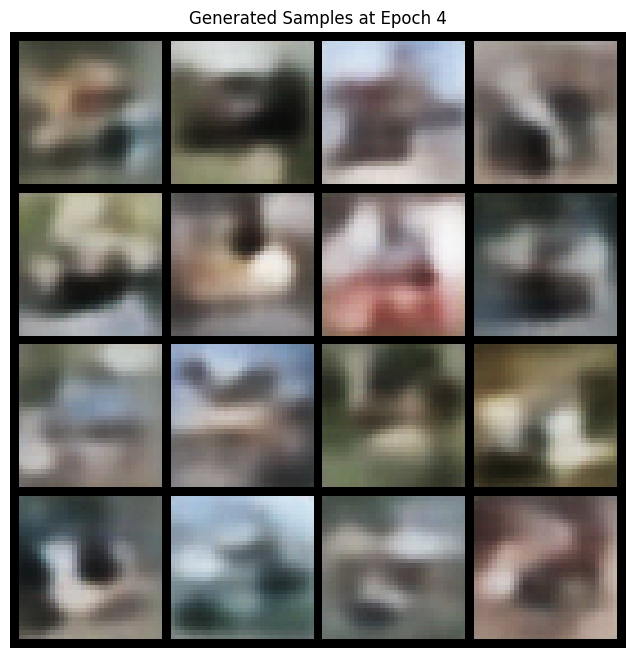

Epoch [5/50], Batch [0/391], Loss: 199.8708
Epoch [5/50], Batch [100/391], Loss: 201.1734
Epoch [5/50], Batch [200/391], Loss: 192.7875
Epoch [5/50], Batch [300/391], Loss: 196.0629
====> Epoch: 5 Average loss: 197.6884, Recon Loss: 139.5133, KLD: 58.1752


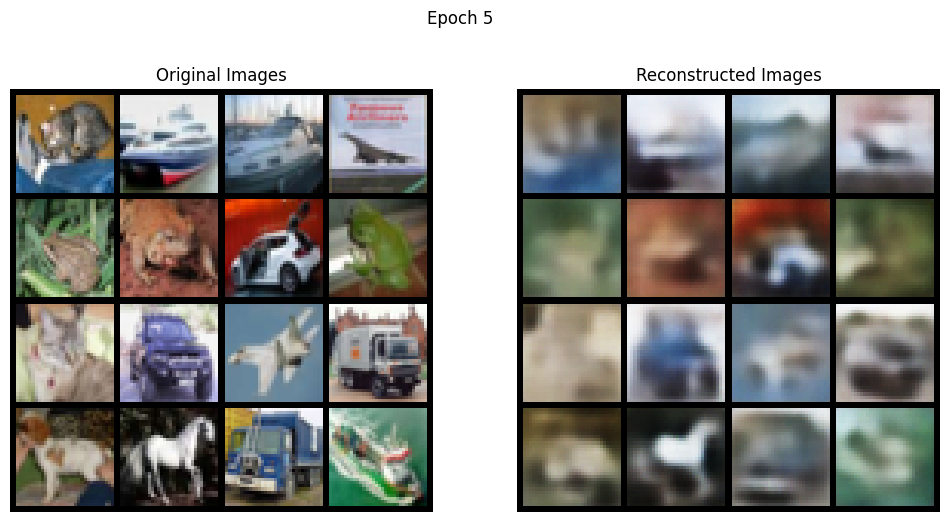

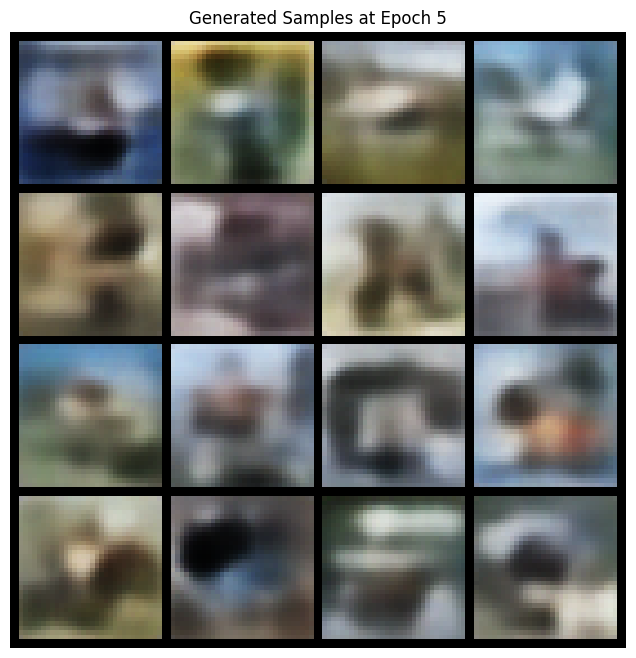

Epoch [6/50], Batch [0/391], Loss: 192.9603
Epoch [6/50], Batch [100/391], Loss: 189.5538
Epoch [6/50], Batch [200/391], Loss: 186.4528
Epoch [6/50], Batch [300/391], Loss: 189.2141
====> Epoch: 6 Average loss: 195.1581, Recon Loss: 135.9520, KLD: 59.2062


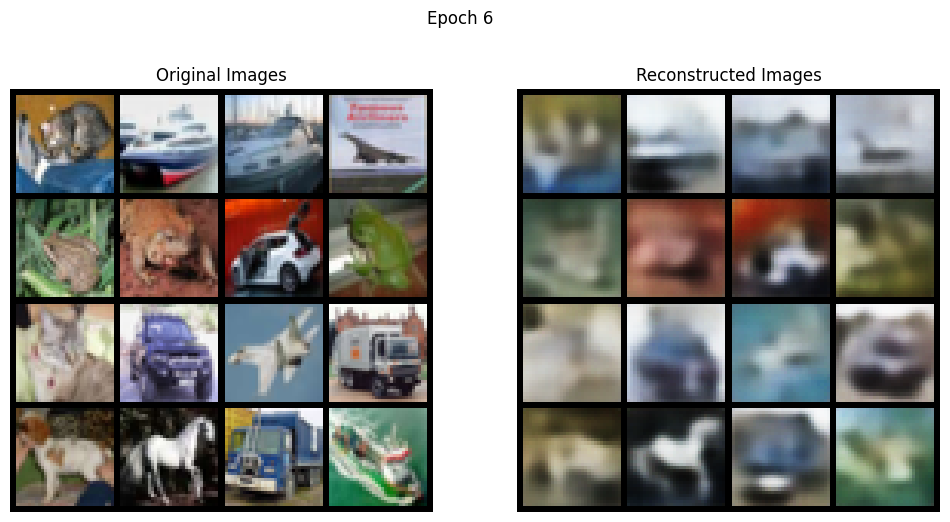

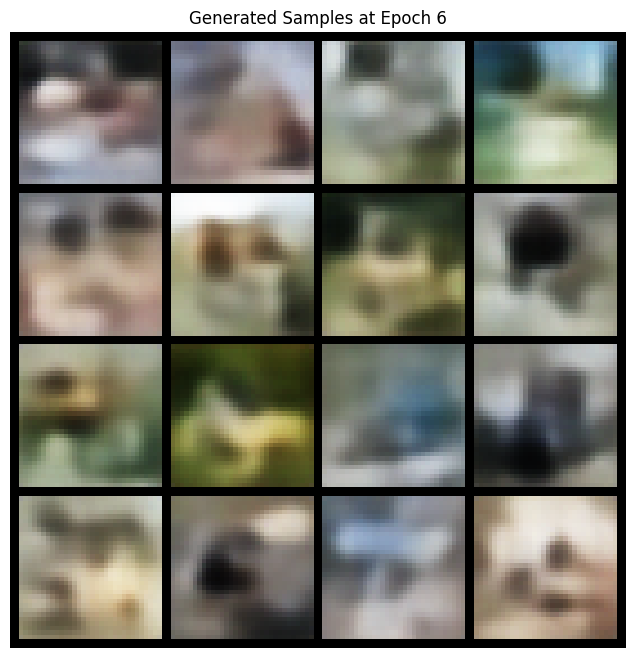

Epoch [7/50], Batch [0/391], Loss: 187.6162
Epoch [7/50], Batch [100/391], Loss: 187.5350
Epoch [7/50], Batch [200/391], Loss: 201.6769
Epoch [7/50], Batch [300/391], Loss: 192.6826
====> Epoch: 7 Average loss: 193.1840, Recon Loss: 133.0366, KLD: 60.1474


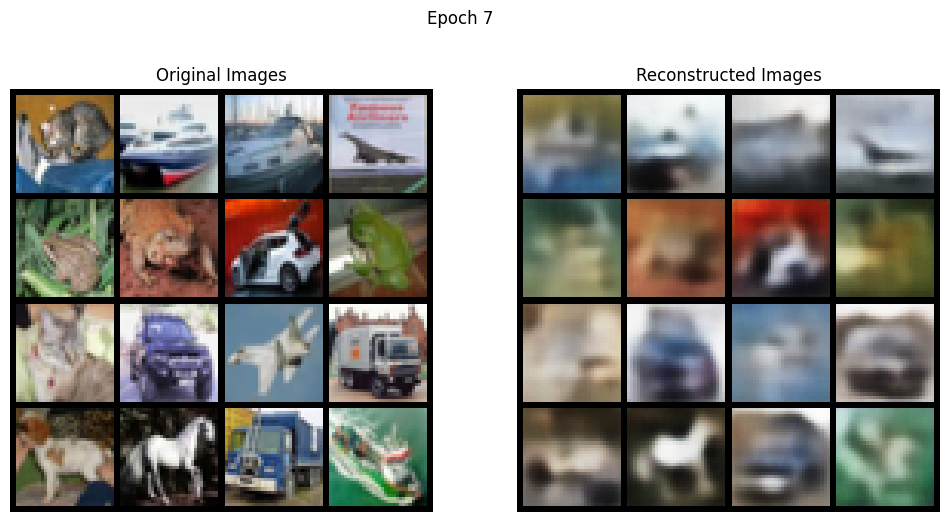

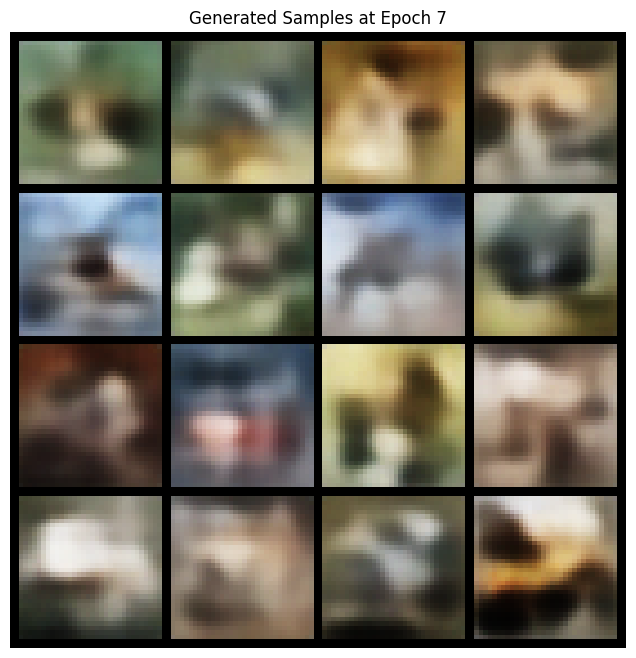

Epoch [8/50], Batch [0/391], Loss: 188.5014
Epoch [8/50], Batch [100/391], Loss: 201.1859
Epoch [8/50], Batch [200/391], Loss: 192.2298
Epoch [8/50], Batch [300/391], Loss: 188.6967
====> Epoch: 8 Average loss: 191.9554, Recon Loss: 131.1394, KLD: 60.8160


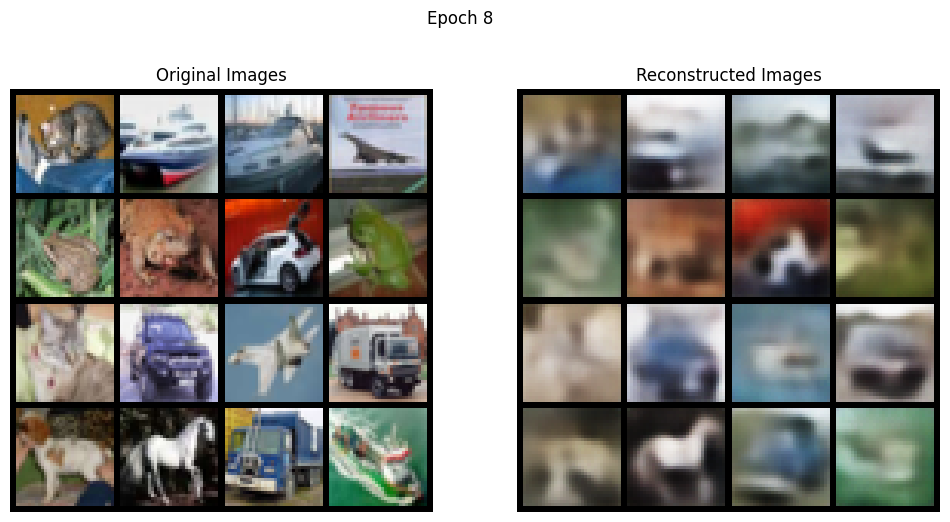

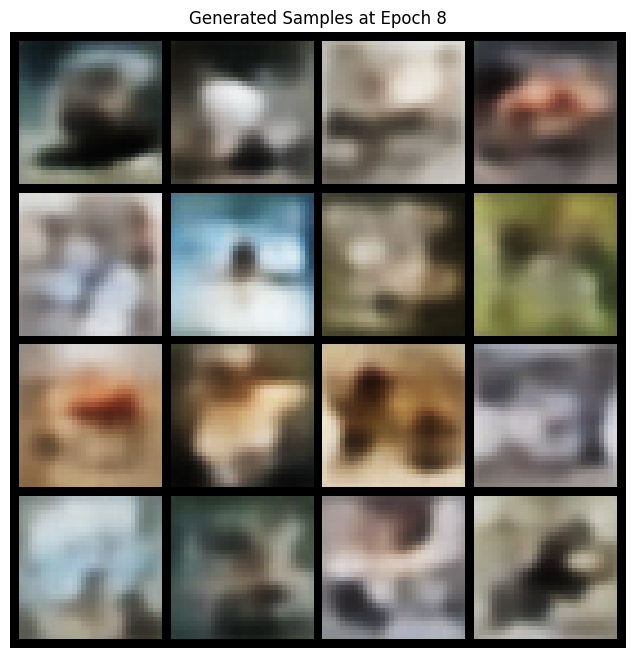

Epoch [9/50], Batch [0/391], Loss: 187.1457
Epoch [9/50], Batch [100/391], Loss: 183.0954
Epoch [9/50], Batch [200/391], Loss: 182.3571
Epoch [9/50], Batch [300/391], Loss: 191.9912
====> Epoch: 9 Average loss: 190.7493, Recon Loss: 129.4032, KLD: 61.3461


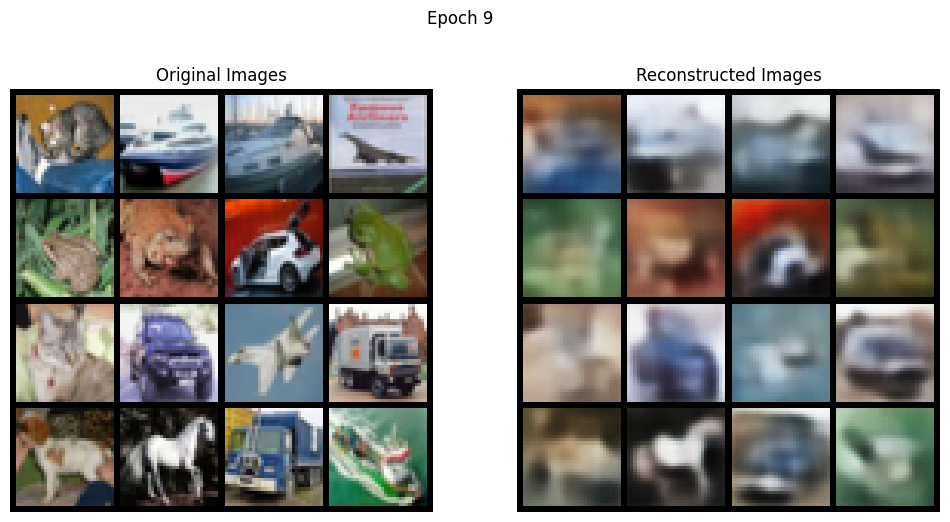

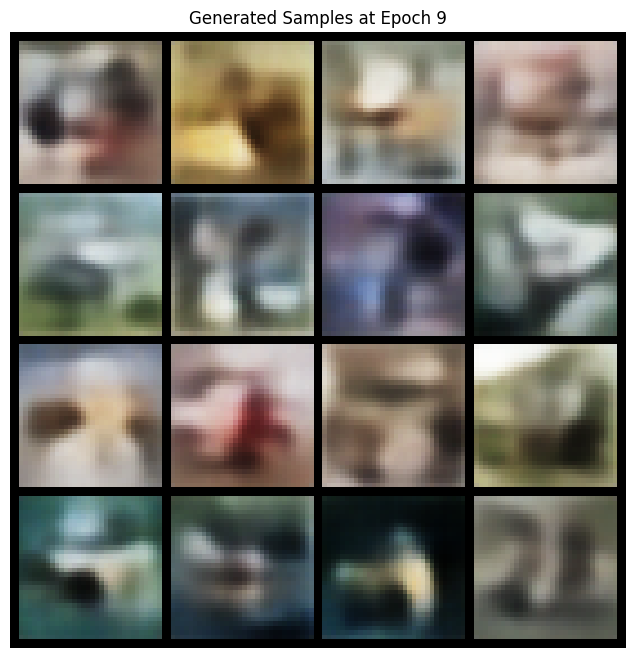

Epoch [10/50], Batch [0/391], Loss: 184.7458
Epoch [10/50], Batch [100/391], Loss: 187.1349
Epoch [10/50], Batch [200/391], Loss: 194.1524
Epoch [10/50], Batch [300/391], Loss: 195.8965
====> Epoch: 10 Average loss: 190.0640, Recon Loss: 128.3532, KLD: 61.7108


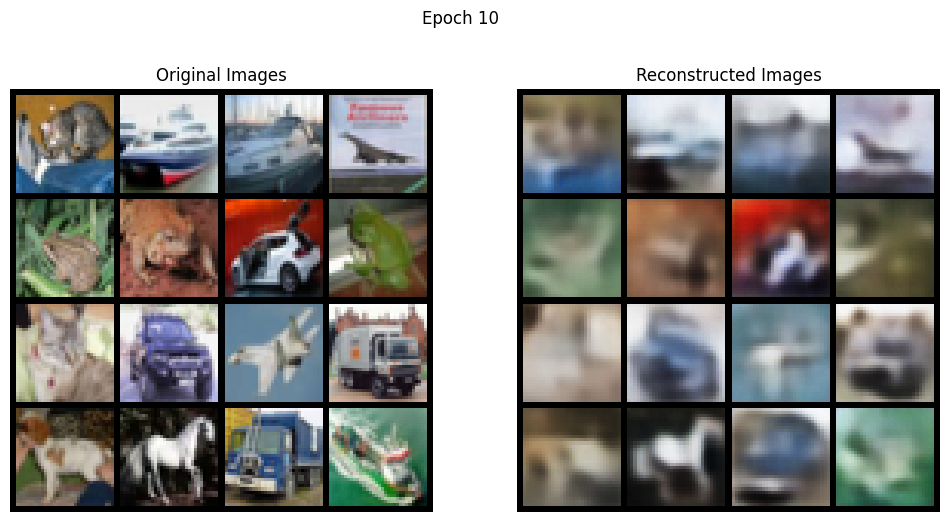

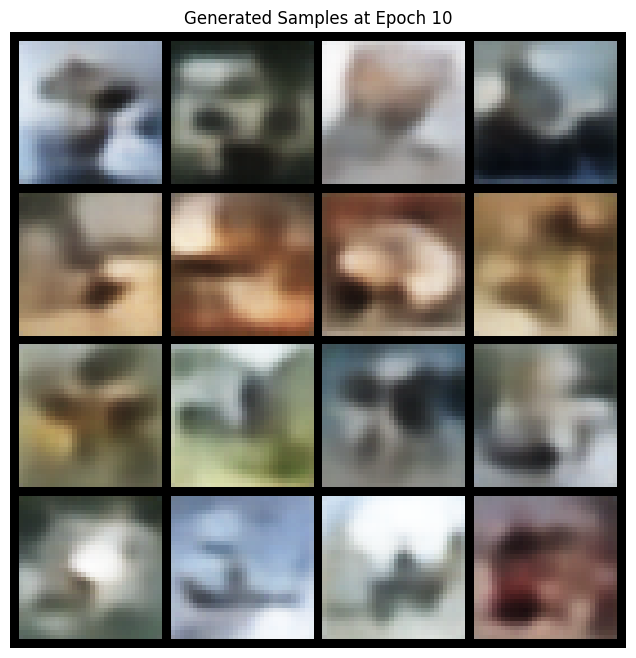

Epoch [11/50], Batch [0/391], Loss: 197.5660
Epoch [11/50], Batch [100/391], Loss: 200.9344
Epoch [11/50], Batch [200/391], Loss: 183.4915
Epoch [11/50], Batch [300/391], Loss: 192.7607
====> Epoch: 11 Average loss: 189.1660, Recon Loss: 127.1263, KLD: 62.0398


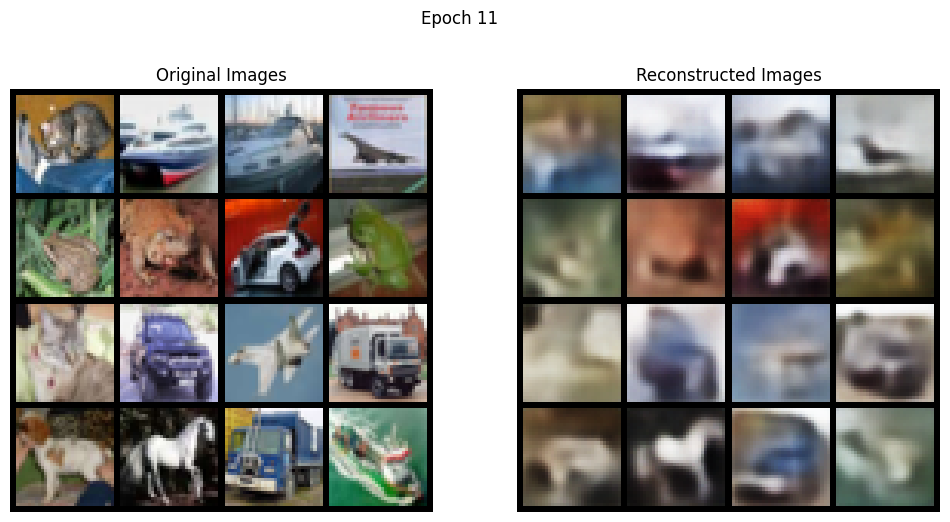

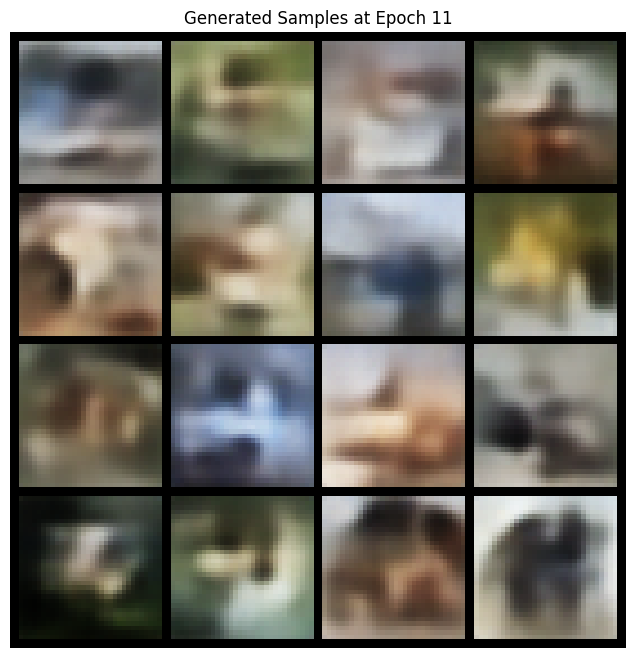

Epoch [12/50], Batch [0/391], Loss: 194.1895
Epoch [12/50], Batch [100/391], Loss: 174.9407
Epoch [12/50], Batch [200/391], Loss: 190.0056
Epoch [12/50], Batch [300/391], Loss: 189.7735
====> Epoch: 12 Average loss: 188.4769, Recon Loss: 126.1039, KLD: 62.3730


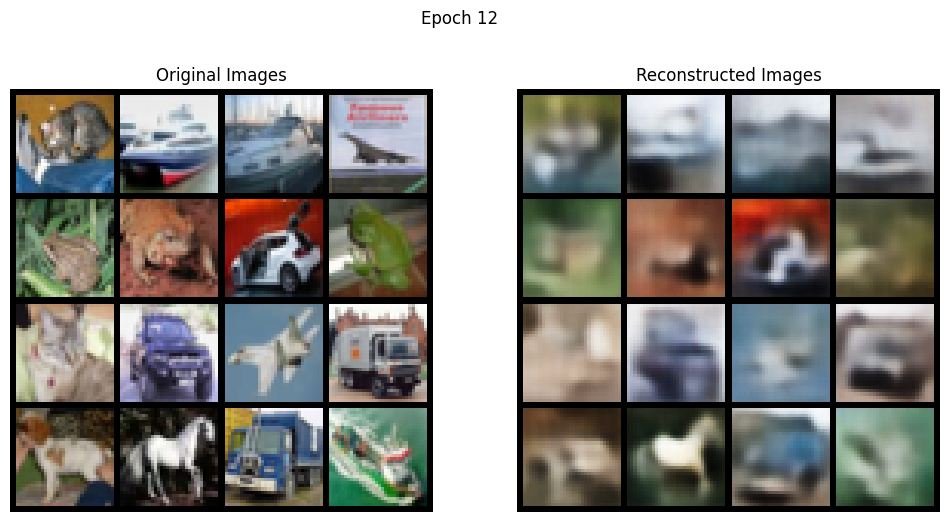

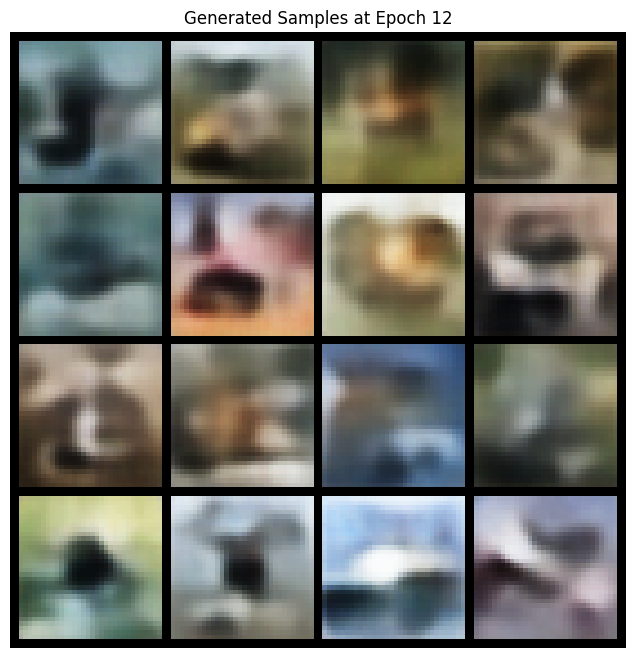

Epoch [13/50], Batch [0/391], Loss: 194.9442
Epoch [13/50], Batch [100/391], Loss: 191.2877
Epoch [13/50], Batch [200/391], Loss: 183.4478
Epoch [13/50], Batch [300/391], Loss: 189.5491
====> Epoch: 13 Average loss: 187.9278, Recon Loss: 125.2294, KLD: 62.6983


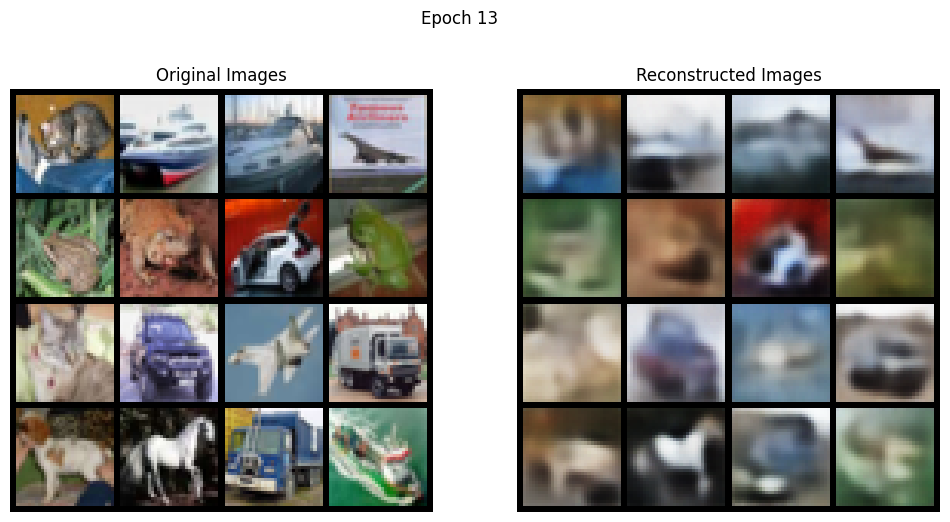

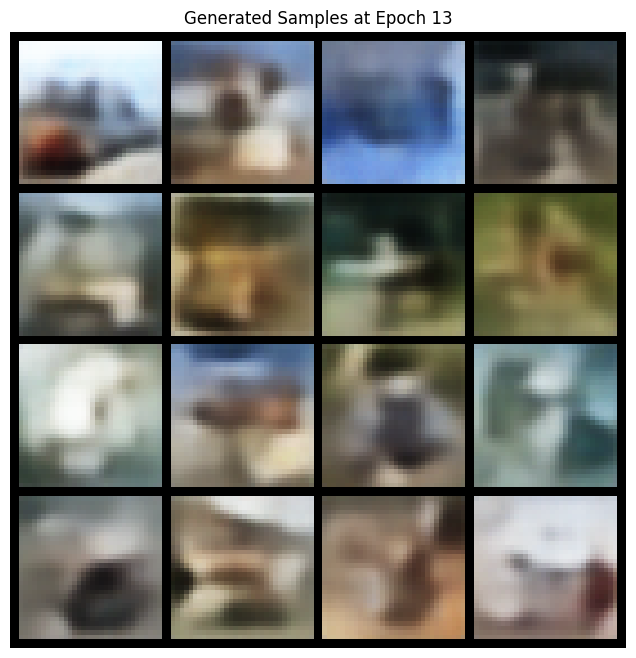

Epoch [14/50], Batch [0/391], Loss: 184.9061
Epoch [14/50], Batch [100/391], Loss: 187.6585
Epoch [14/50], Batch [200/391], Loss: 171.3075
Epoch [14/50], Batch [300/391], Loss: 187.2682
====> Epoch: 14 Average loss: 187.4787, Recon Loss: 124.5493, KLD: 62.9294


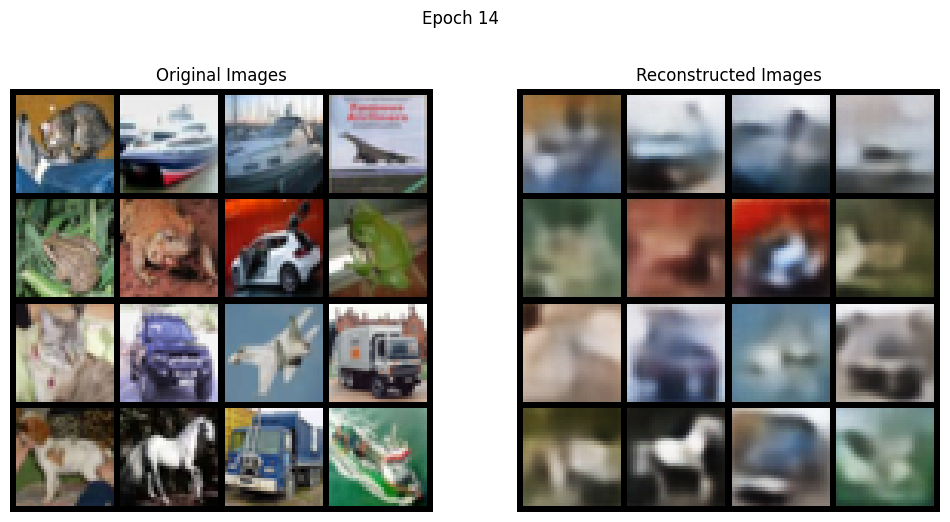

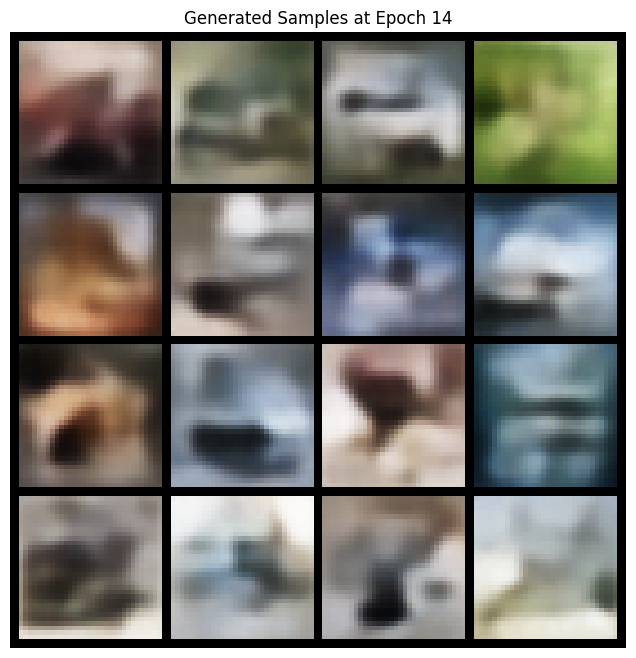

Epoch [15/50], Batch [0/391], Loss: 184.1491
Epoch [15/50], Batch [100/391], Loss: 188.5132
Epoch [15/50], Batch [200/391], Loss: 196.0523
Epoch [15/50], Batch [300/391], Loss: 183.1210
====> Epoch: 15 Average loss: 187.0439, Recon Loss: 123.8854, KLD: 63.1584


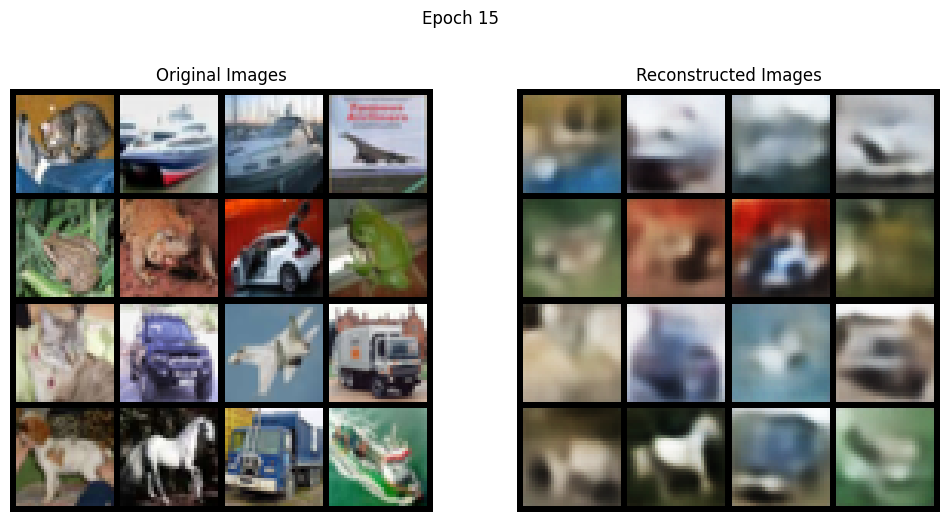

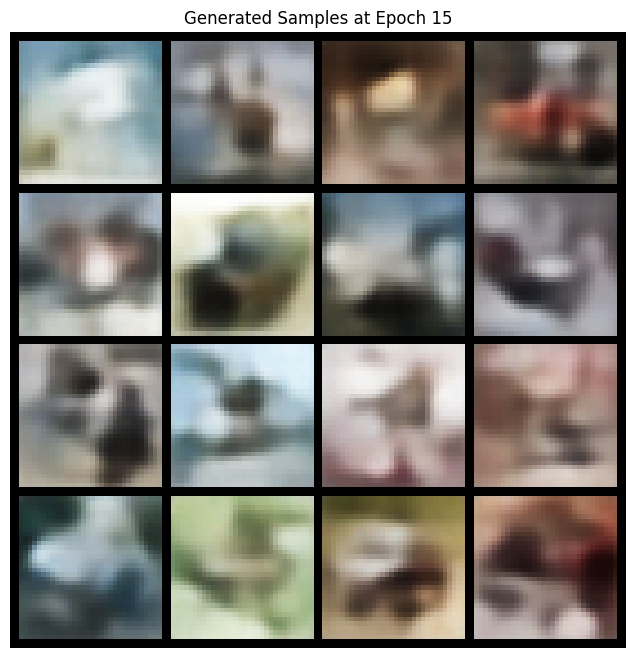

Epoch [16/50], Batch [0/391], Loss: 184.1176
Epoch [16/50], Batch [100/391], Loss: 192.1729
Epoch [16/50], Batch [200/391], Loss: 194.0858
Epoch [16/50], Batch [300/391], Loss: 195.0116
====> Epoch: 16 Average loss: 186.5833, Recon Loss: 123.2712, KLD: 63.3121


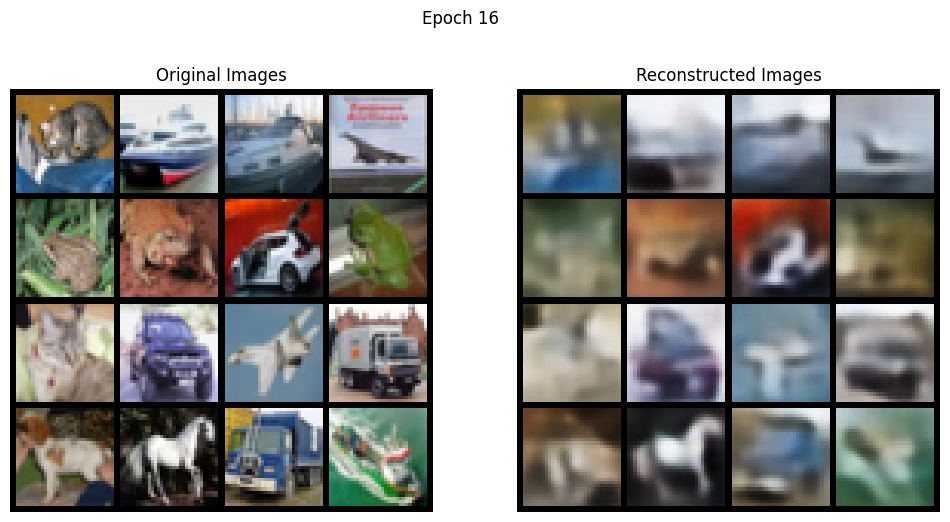

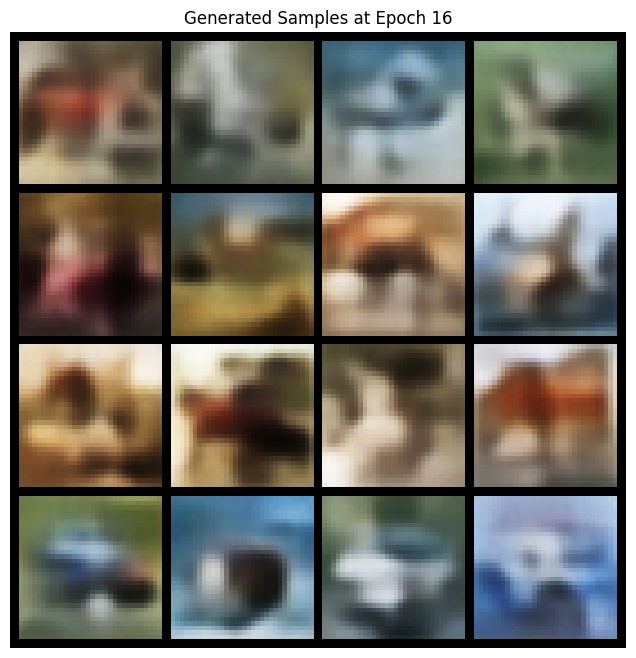

Epoch [17/50], Batch [0/391], Loss: 183.8202
Epoch [17/50], Batch [100/391], Loss: 188.2331
Epoch [17/50], Batch [200/391], Loss: 195.5260
Epoch [17/50], Batch [300/391], Loss: 189.0391
====> Epoch: 17 Average loss: 186.2030, Recon Loss: 122.7486, KLD: 63.4544


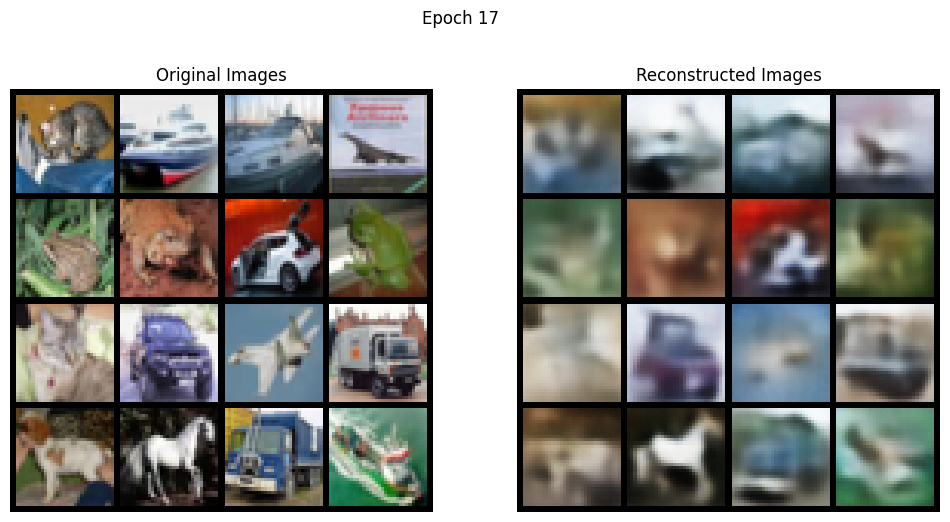

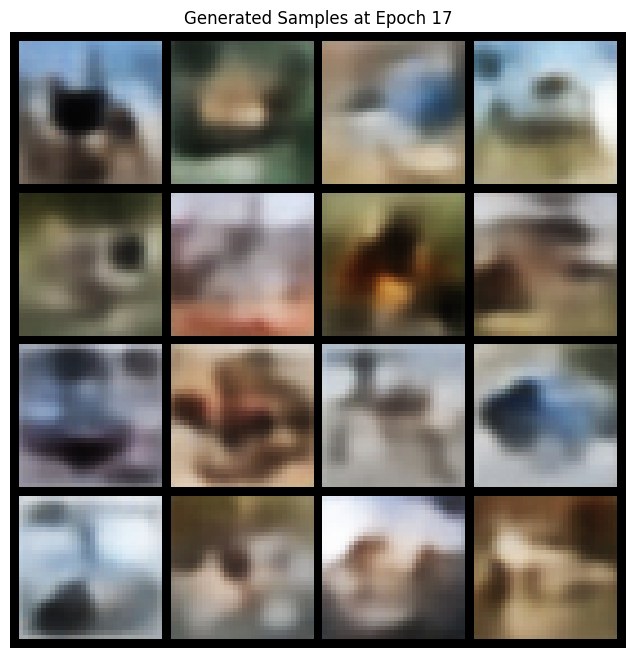

Epoch [18/50], Batch [0/391], Loss: 188.9848
Epoch [18/50], Batch [100/391], Loss: 186.3090
Epoch [18/50], Batch [200/391], Loss: 187.3466
Epoch [18/50], Batch [300/391], Loss: 183.7467
====> Epoch: 18 Average loss: 185.9829, Recon Loss: 122.3948, KLD: 63.5881


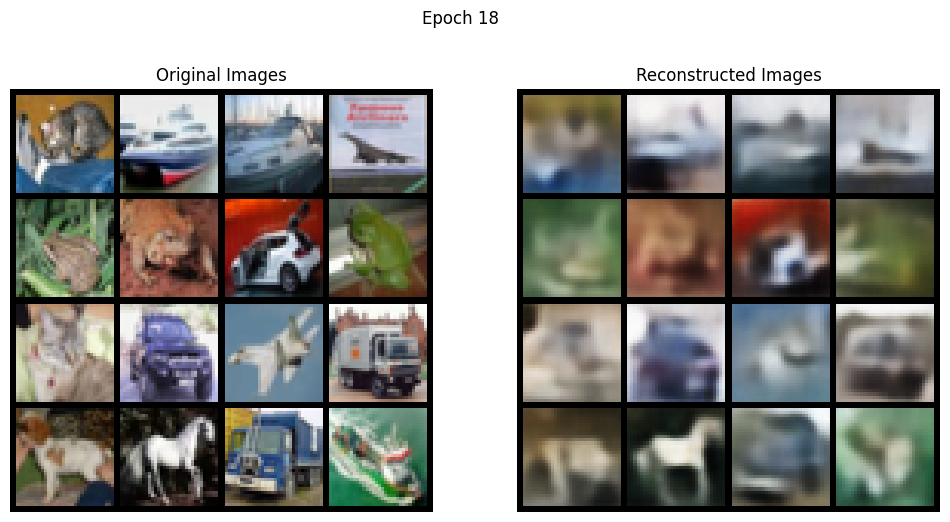

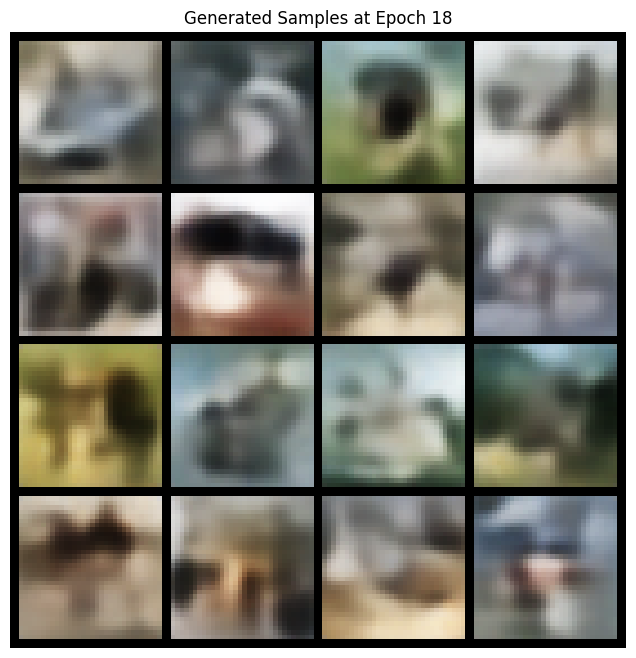

Epoch [19/50], Batch [0/391], Loss: 178.7154
Epoch [19/50], Batch [100/391], Loss: 185.8097
Epoch [19/50], Batch [200/391], Loss: 187.2325
Epoch [19/50], Batch [300/391], Loss: 193.1930
====> Epoch: 19 Average loss: 185.7142, Recon Loss: 122.0052, KLD: 63.7090


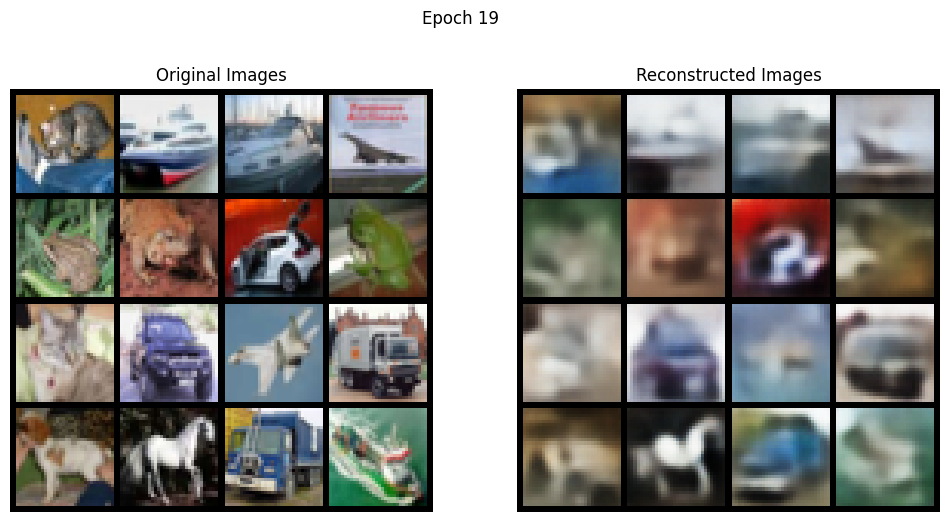

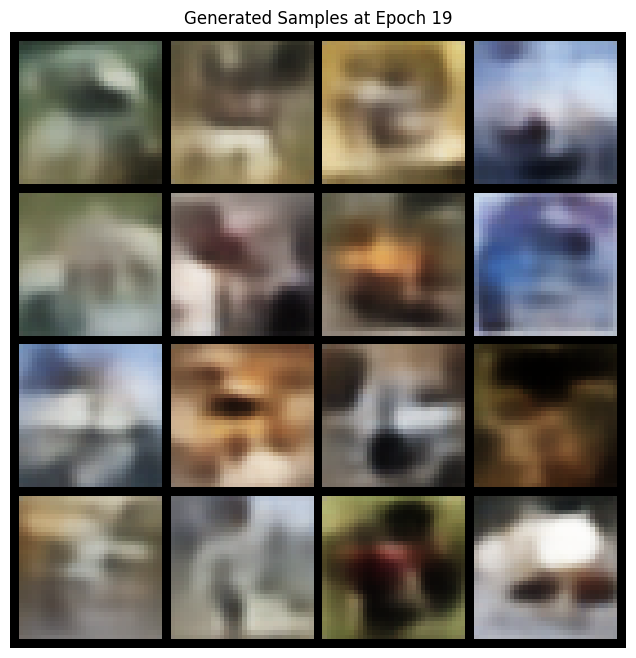

Epoch [20/50], Batch [0/391], Loss: 188.9760
Epoch [20/50], Batch [100/391], Loss: 188.9089
Epoch [20/50], Batch [200/391], Loss: 181.9819
Epoch [20/50], Batch [300/391], Loss: 183.8612
====> Epoch: 20 Average loss: 185.4027, Recon Loss: 121.5533, KLD: 63.8493


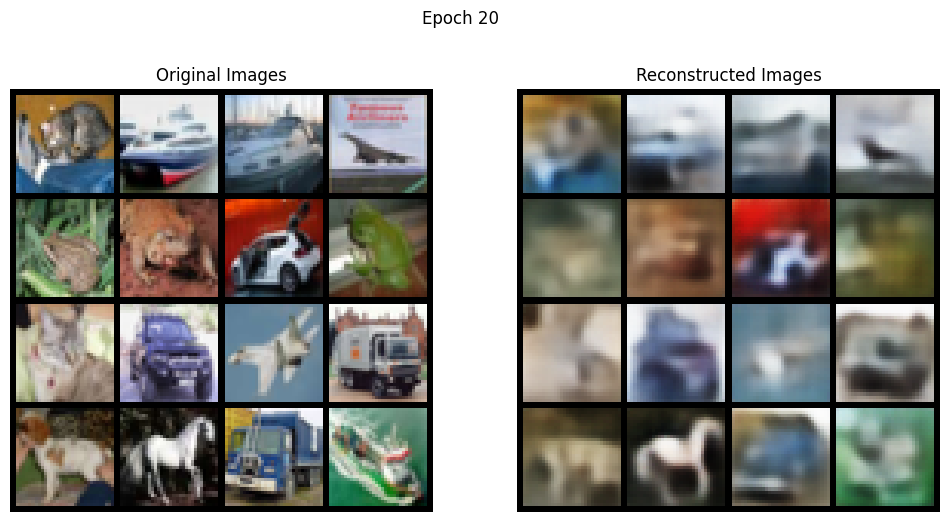

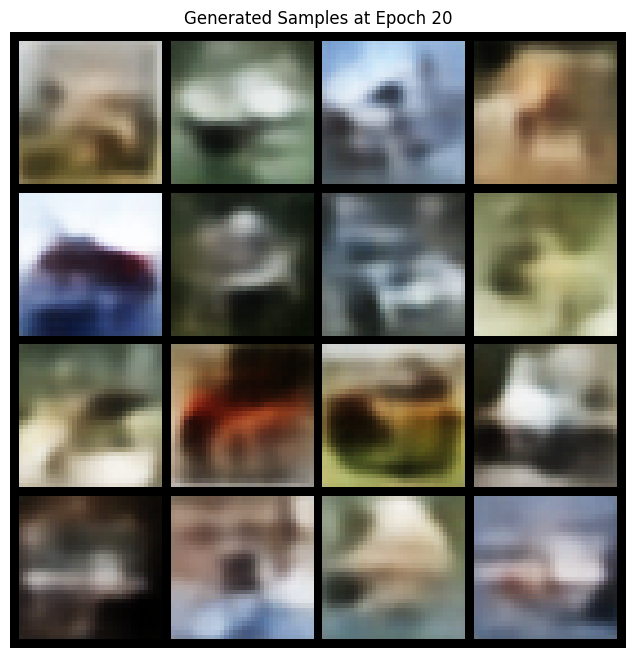

Epoch [21/50], Batch [0/391], Loss: 185.6862
Epoch [21/50], Batch [100/391], Loss: 191.2872
Epoch [21/50], Batch [200/391], Loss: 185.5471
Epoch [21/50], Batch [300/391], Loss: 178.0855
====> Epoch: 21 Average loss: 184.9853, Recon Loss: 121.0426, KLD: 63.9427


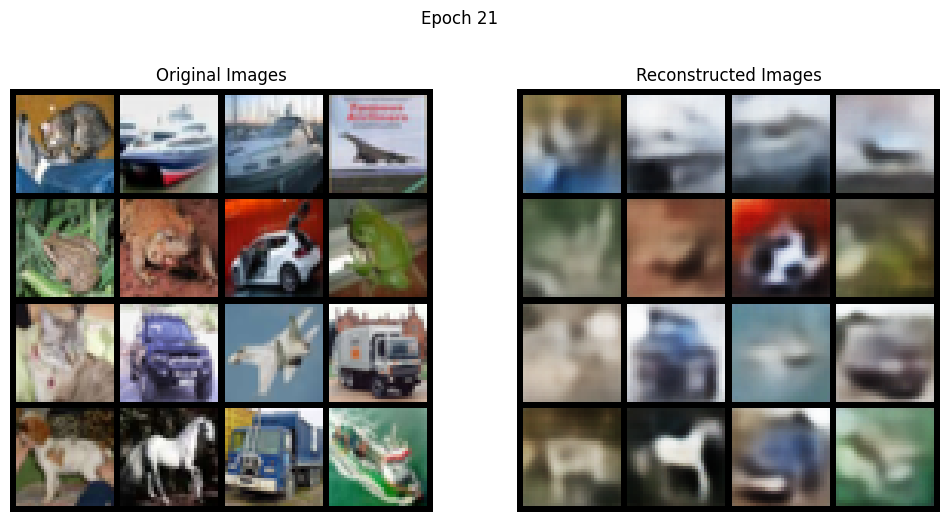

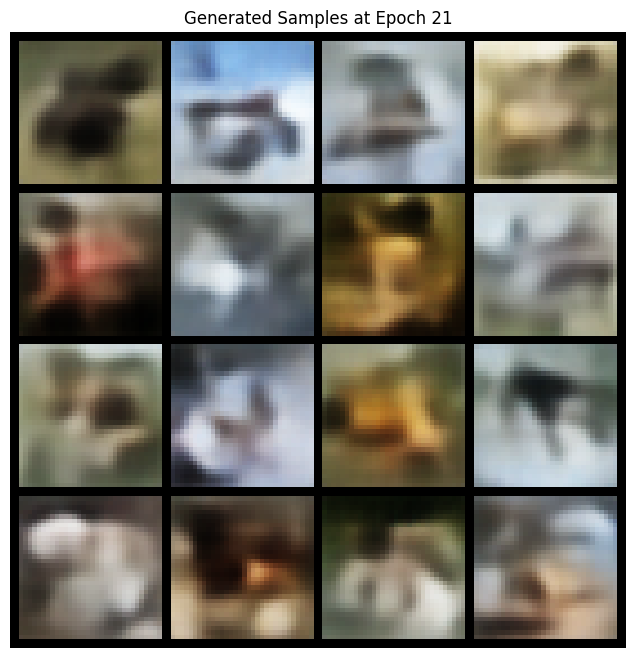

Epoch [22/50], Batch [0/391], Loss: 188.0565
Epoch [22/50], Batch [100/391], Loss: 184.0474
Epoch [22/50], Batch [200/391], Loss: 192.7881
Epoch [22/50], Batch [300/391], Loss: 186.4586
====> Epoch: 22 Average loss: 184.8349, Recon Loss: 120.7178, KLD: 64.1170


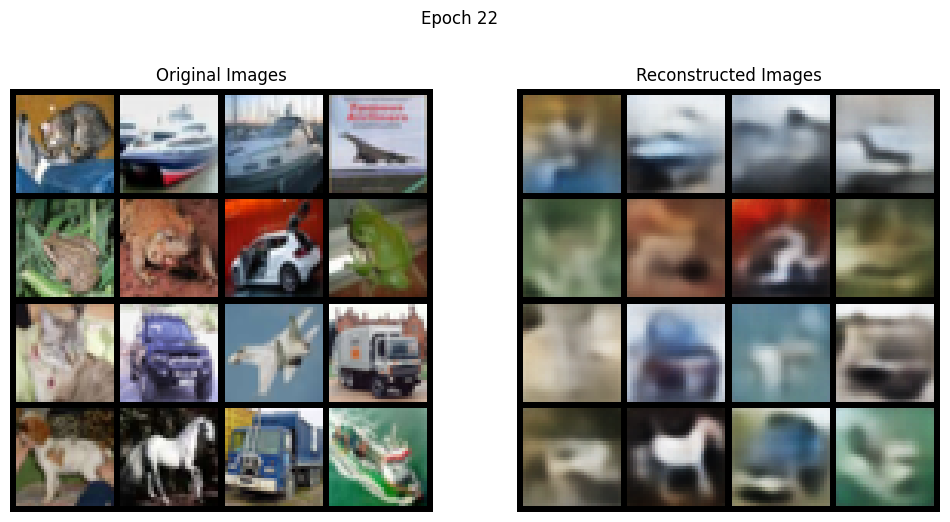

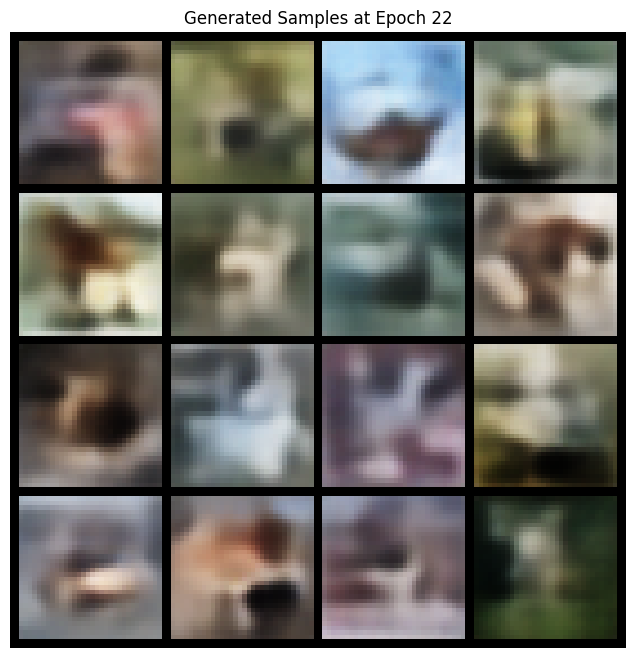

Epoch [23/50], Batch [0/391], Loss: 188.6234
Epoch [23/50], Batch [100/391], Loss: 179.0980
Epoch [23/50], Batch [200/391], Loss: 188.2099
Epoch [23/50], Batch [300/391], Loss: 185.8888
====> Epoch: 23 Average loss: 184.5202, Recon Loss: 120.2667, KLD: 64.2535


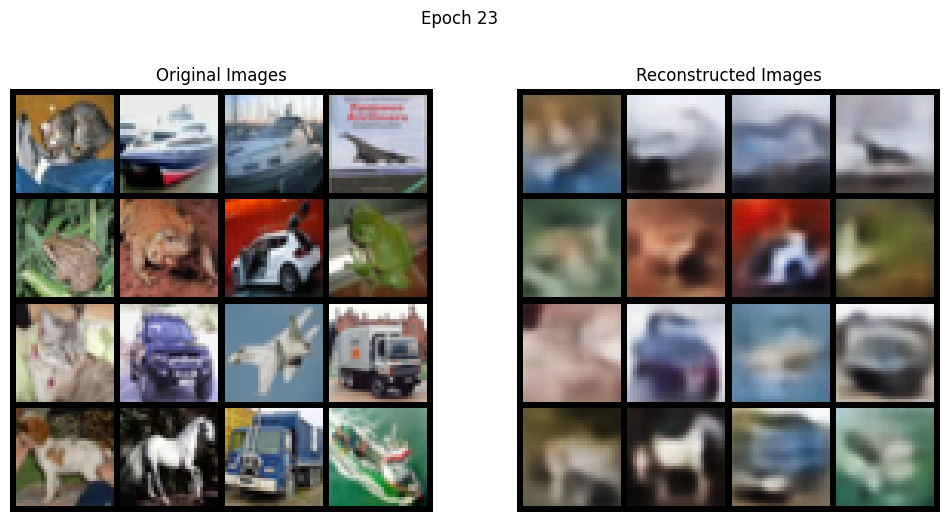

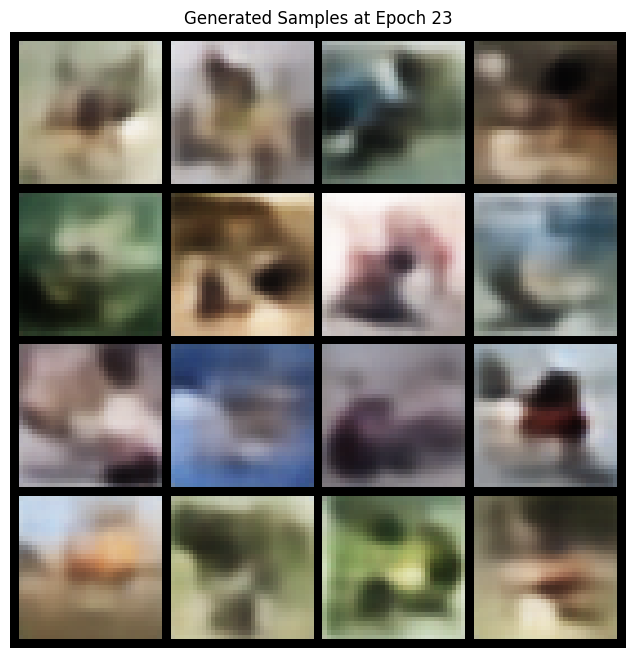

Epoch [24/50], Batch [0/391], Loss: 192.0574
Epoch [24/50], Batch [100/391], Loss: 184.6115
Epoch [24/50], Batch [200/391], Loss: 179.9573
Epoch [24/50], Batch [300/391], Loss: 191.6327
====> Epoch: 24 Average loss: 184.3479, Recon Loss: 120.0479, KLD: 64.3000


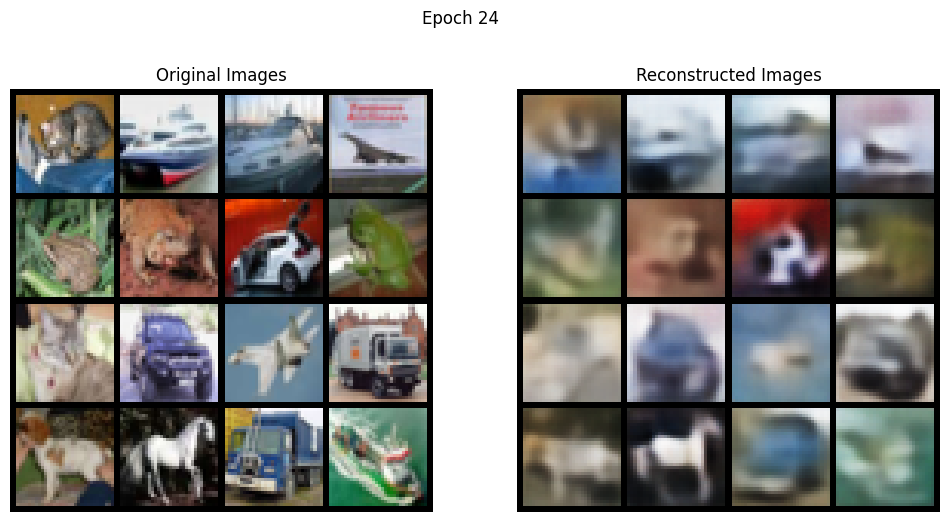

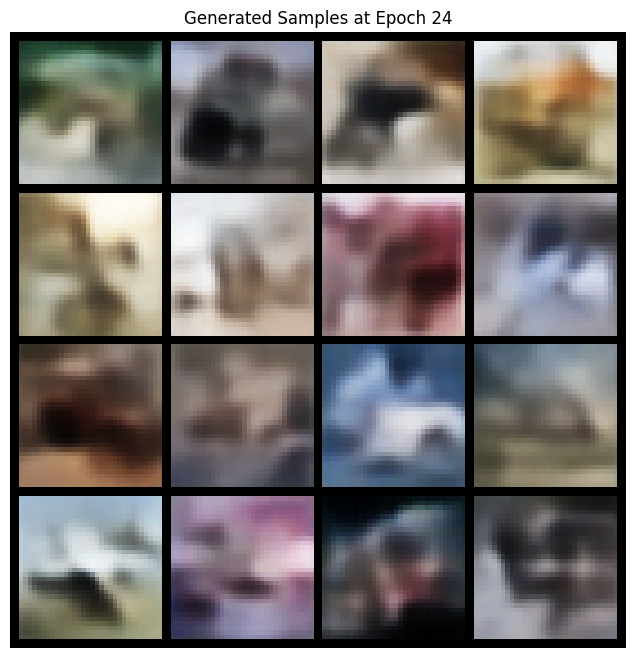

Epoch [25/50], Batch [0/391], Loss: 176.2586
Epoch [25/50], Batch [100/391], Loss: 183.5044
Epoch [25/50], Batch [200/391], Loss: 175.7420
Epoch [25/50], Batch [300/391], Loss: 185.9721
====> Epoch: 25 Average loss: 184.1308, Recon Loss: 119.6619, KLD: 64.4689


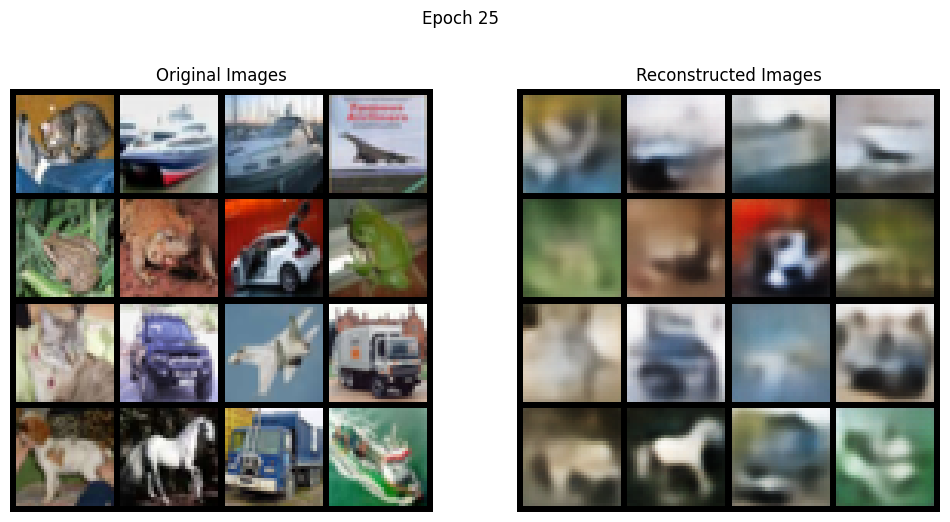

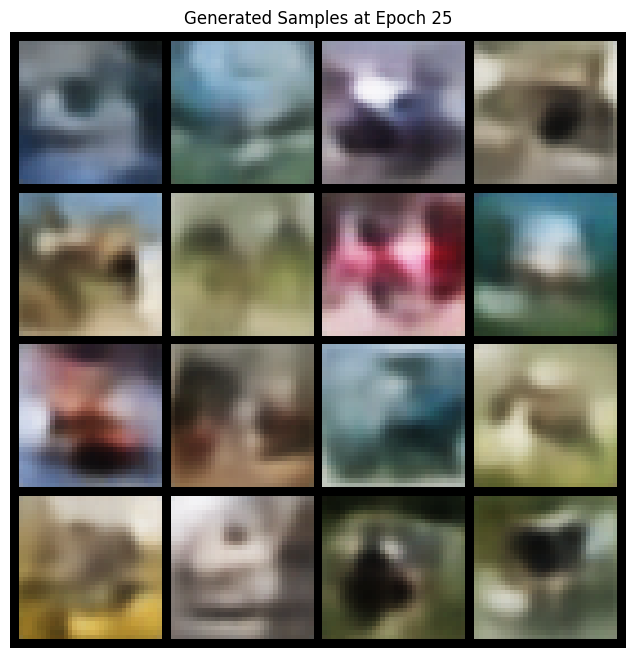

Epoch [26/50], Batch [0/391], Loss: 186.7641
Epoch [26/50], Batch [100/391], Loss: 187.9145
Epoch [26/50], Batch [200/391], Loss: 179.4387
Epoch [26/50], Batch [300/391], Loss: 192.5701
====> Epoch: 26 Average loss: 184.0227, Recon Loss: 119.4900, KLD: 64.5327


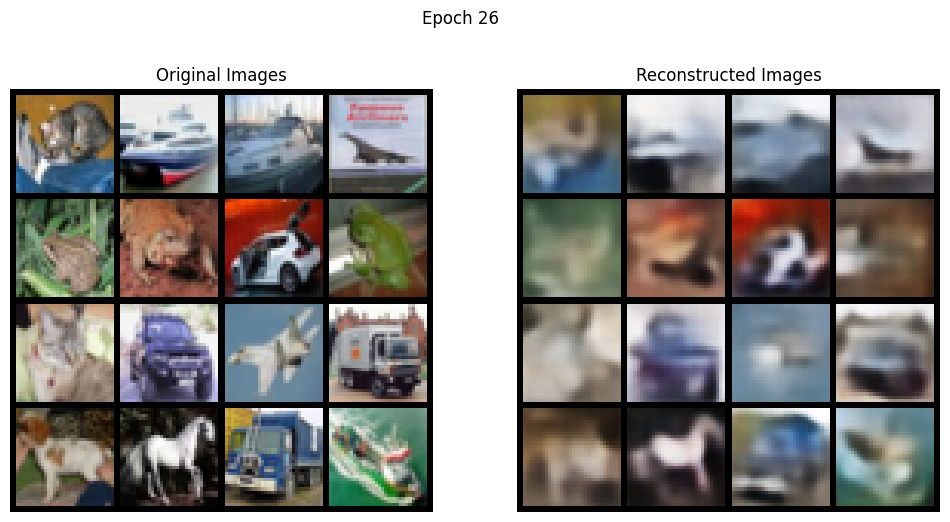

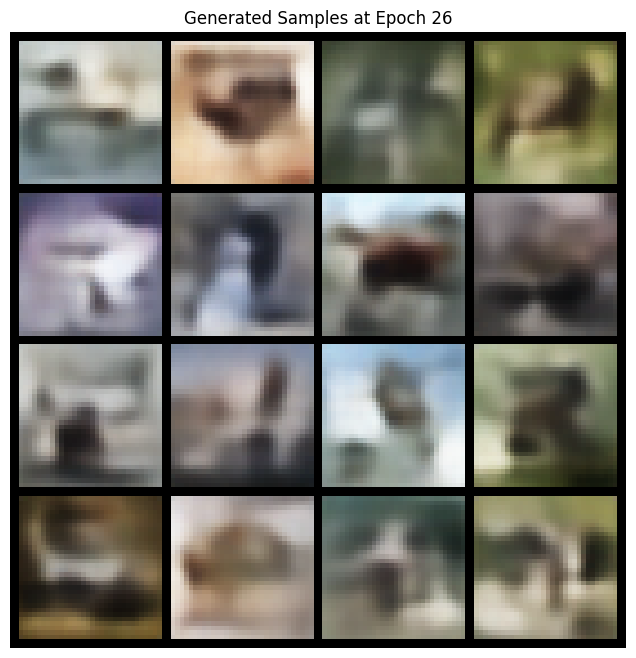

Epoch [27/50], Batch [0/391], Loss: 172.5200
Epoch [27/50], Batch [100/391], Loss: 192.3863
Epoch [27/50], Batch [200/391], Loss: 180.9221
Epoch [27/50], Batch [300/391], Loss: 185.6195
====> Epoch: 27 Average loss: 183.8067, Recon Loss: 119.1654, KLD: 64.6412


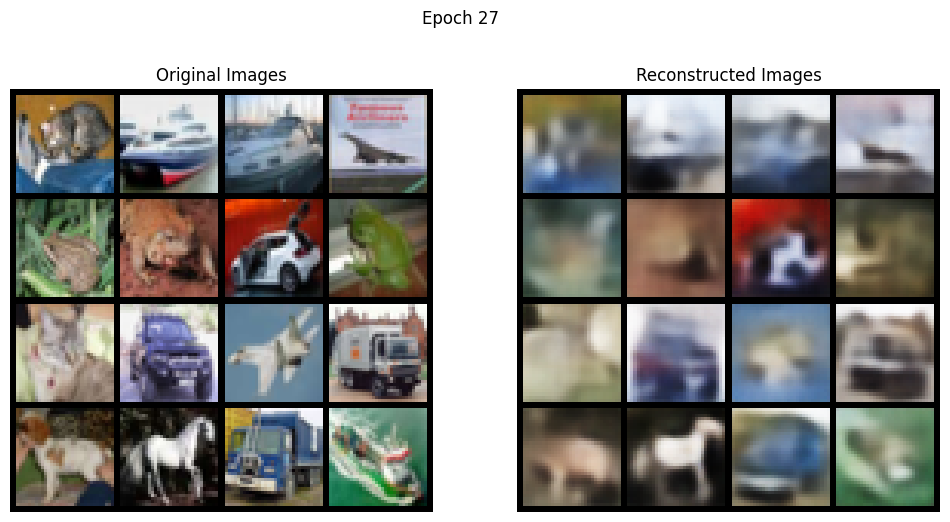

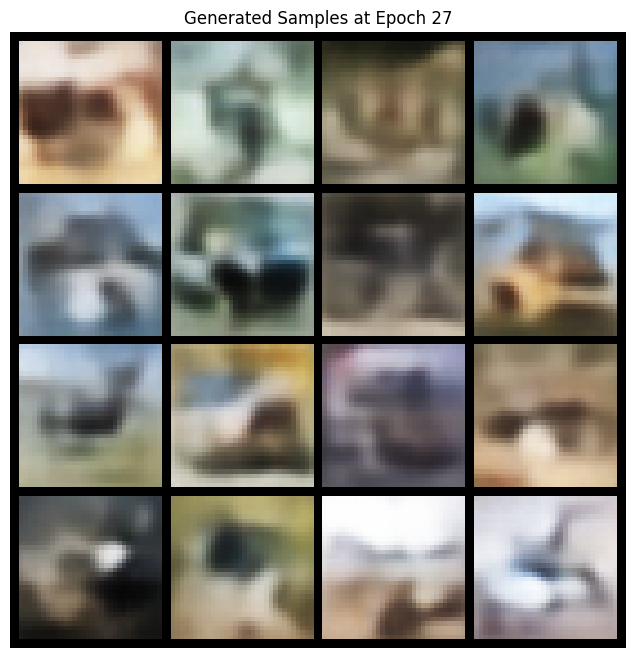

Epoch [28/50], Batch [0/391], Loss: 181.2418
Epoch [28/50], Batch [100/391], Loss: 189.0675
Epoch [28/50], Batch [200/391], Loss: 178.5022
Epoch [28/50], Batch [300/391], Loss: 181.3390
====> Epoch: 28 Average loss: 183.5587, Recon Loss: 118.8303, KLD: 64.7285


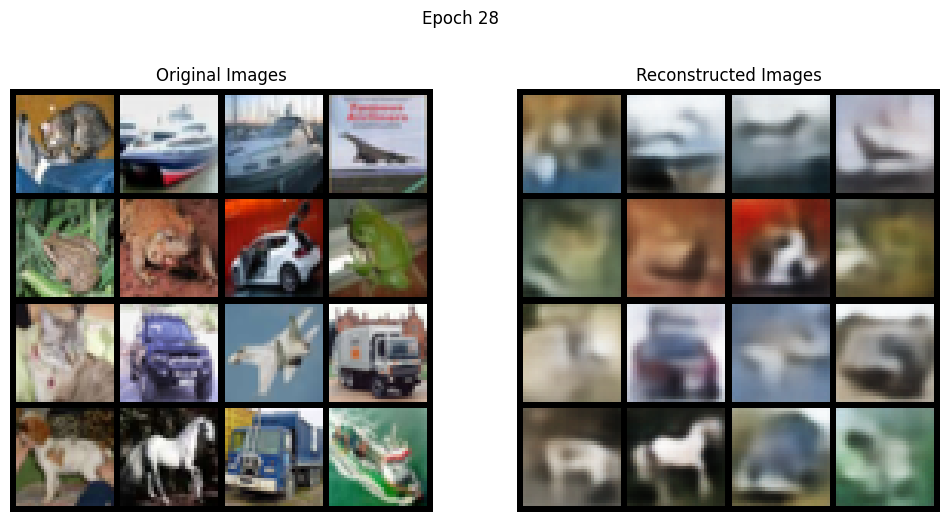

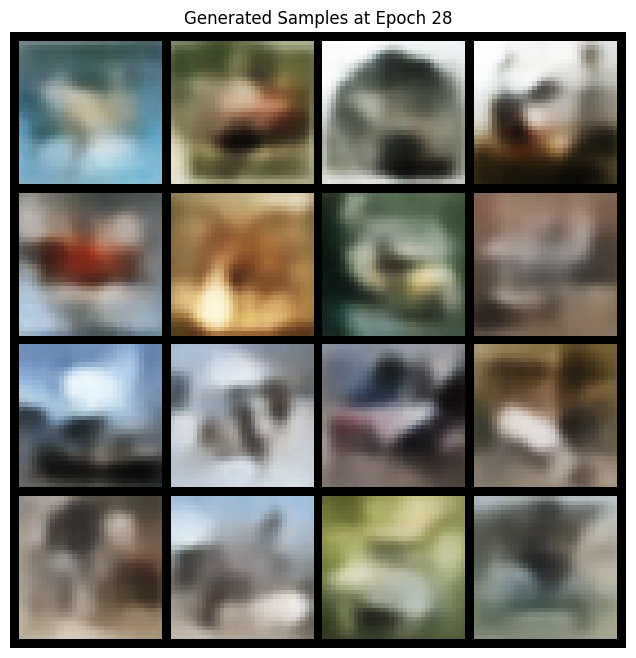

Epoch [29/50], Batch [0/391], Loss: 184.5620
Epoch [29/50], Batch [100/391], Loss: 171.2747
Epoch [29/50], Batch [200/391], Loss: 178.3900
Epoch [29/50], Batch [300/391], Loss: 185.3461
====> Epoch: 29 Average loss: 183.4839, Recon Loss: 118.7123, KLD: 64.7716


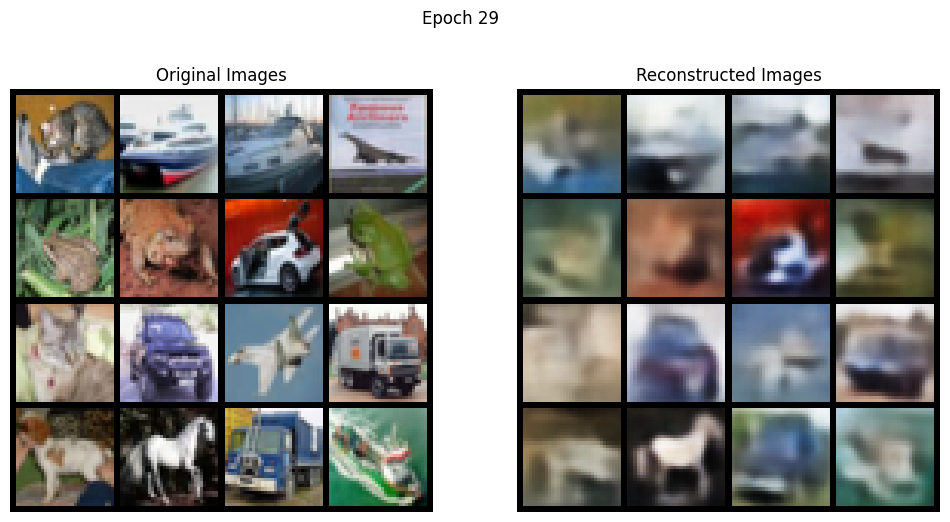

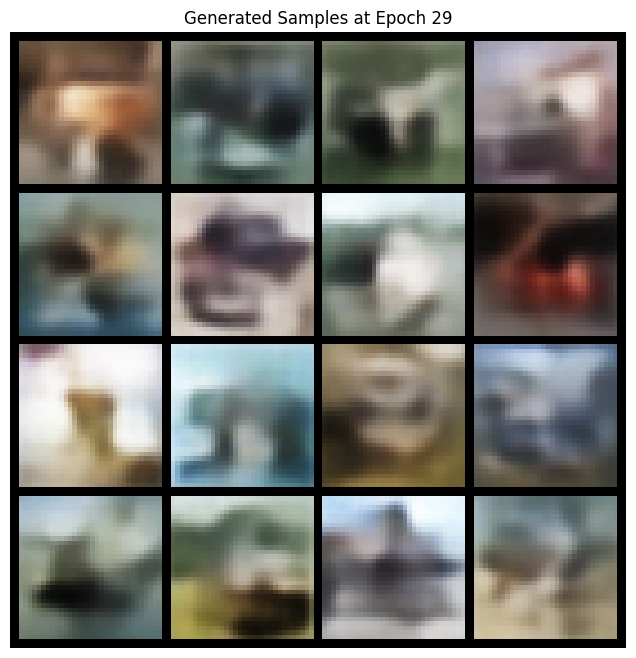

Epoch [30/50], Batch [0/391], Loss: 189.2111
Epoch [30/50], Batch [100/391], Loss: 191.4021
Epoch [30/50], Batch [200/391], Loss: 188.2247
Epoch [30/50], Batch [300/391], Loss: 191.8818
====> Epoch: 30 Average loss: 183.2790, Recon Loss: 118.4271, KLD: 64.8518


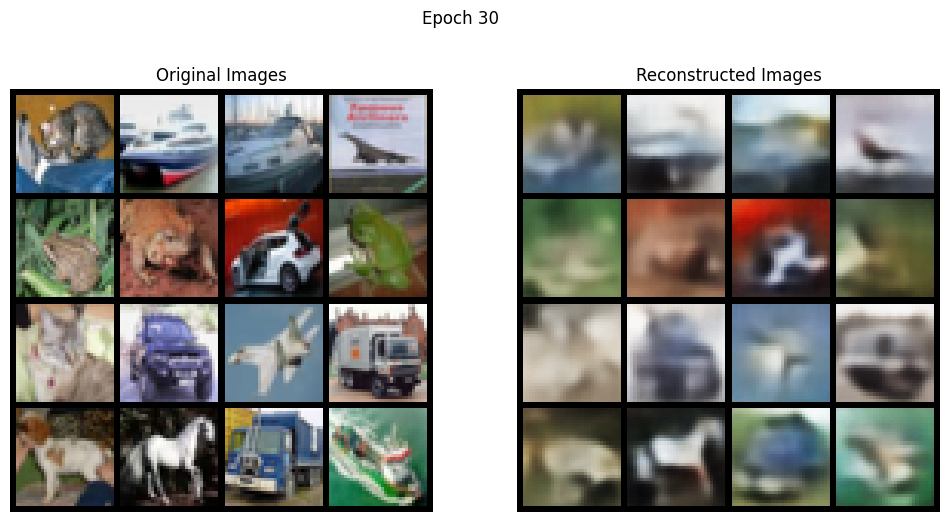

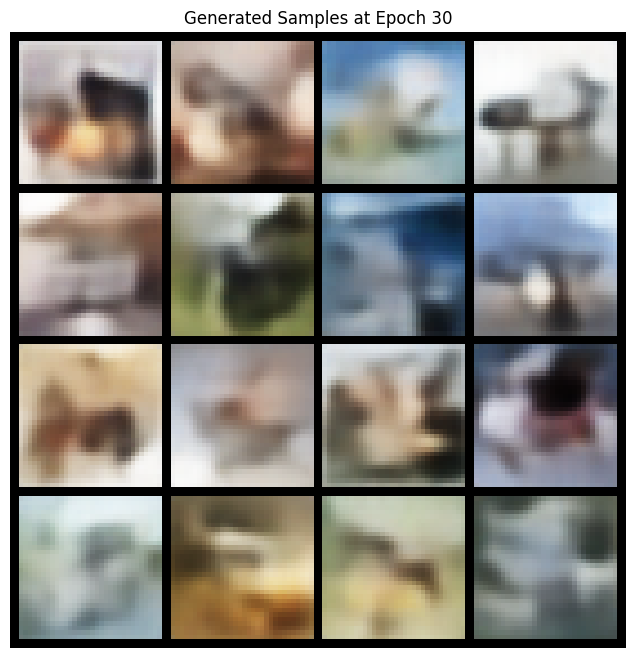

Epoch [31/50], Batch [0/391], Loss: 185.6814
Epoch [31/50], Batch [100/391], Loss: 191.4567
Epoch [31/50], Batch [200/391], Loss: 181.4803
Epoch [31/50], Batch [300/391], Loss: 177.6086
====> Epoch: 31 Average loss: 183.1283, Recon Loss: 118.1980, KLD: 64.9302


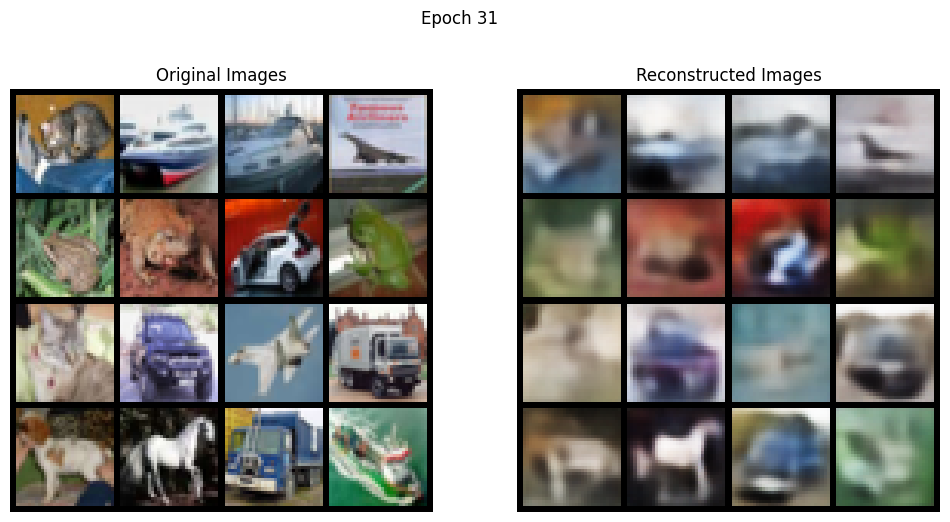

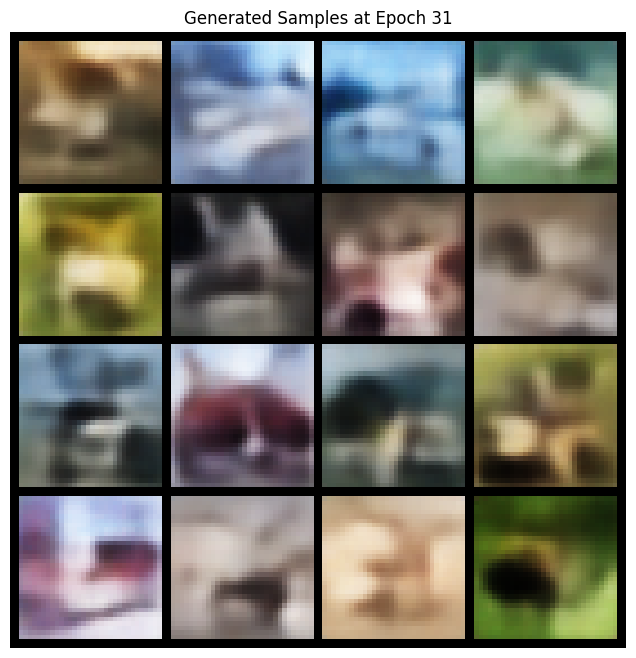

Epoch [32/50], Batch [0/391], Loss: 180.1744
Epoch [32/50], Batch [100/391], Loss: 183.6761
Epoch [32/50], Batch [200/391], Loss: 184.3776
Epoch [32/50], Batch [300/391], Loss: 185.3801
====> Epoch: 32 Average loss: 183.0042, Recon Loss: 117.9789, KLD: 65.0253


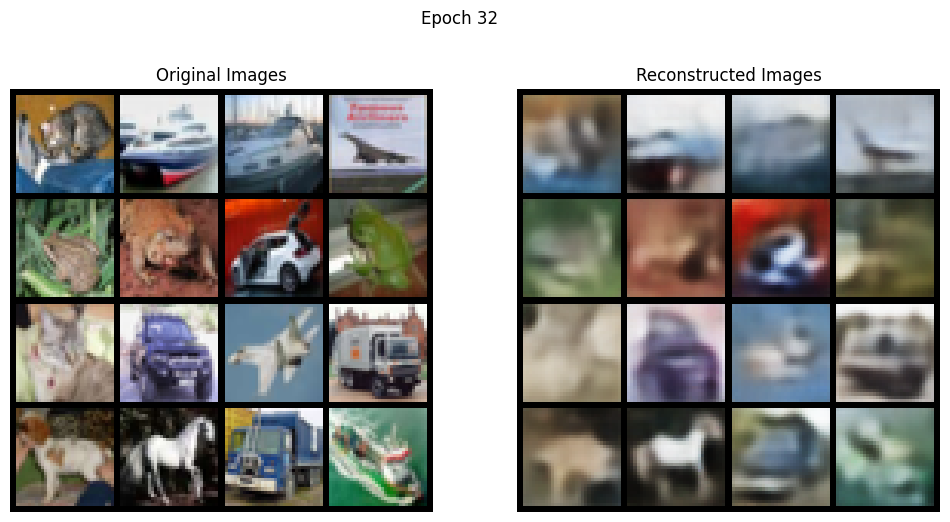

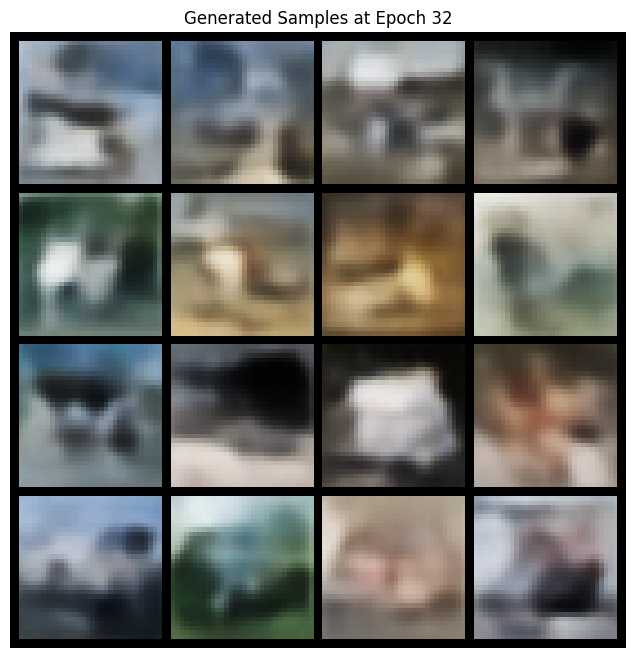

Epoch [33/50], Batch [0/391], Loss: 182.1361
Epoch [33/50], Batch [100/391], Loss: 189.2929
Epoch [33/50], Batch [200/391], Loss: 180.9576
Epoch [33/50], Batch [300/391], Loss: 178.4392
====> Epoch: 33 Average loss: 182.9085, Recon Loss: 117.8626, KLD: 65.0460


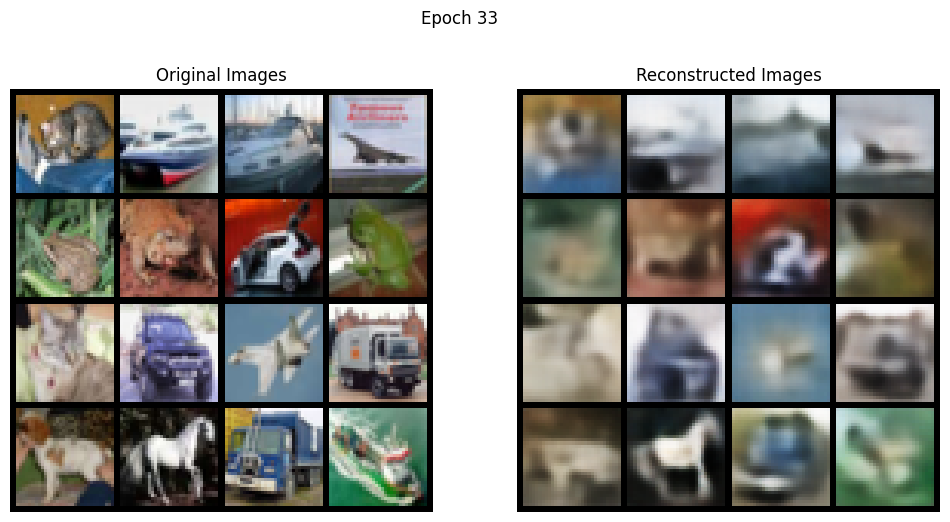

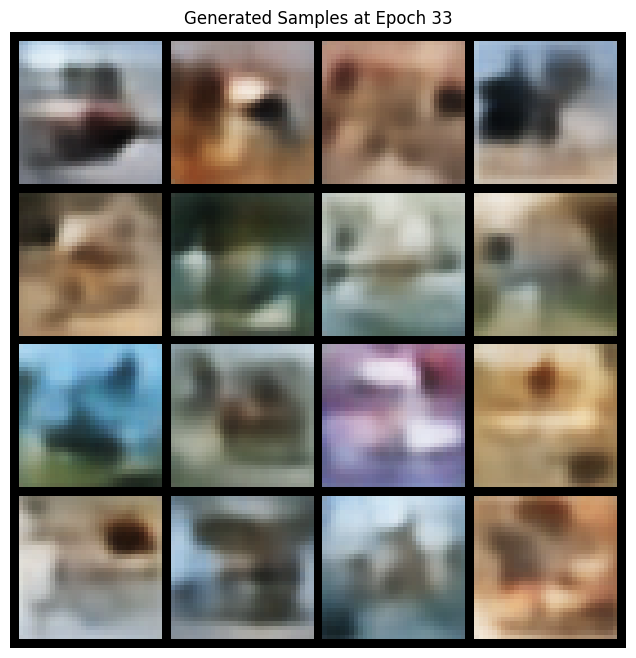

Epoch [34/50], Batch [0/391], Loss: 182.8957
Epoch [34/50], Batch [100/391], Loss: 190.9921
Epoch [34/50], Batch [200/391], Loss: 185.8296
Epoch [34/50], Batch [300/391], Loss: 189.7825
====> Epoch: 34 Average loss: 182.8605, Recon Loss: 117.7842, KLD: 65.0763


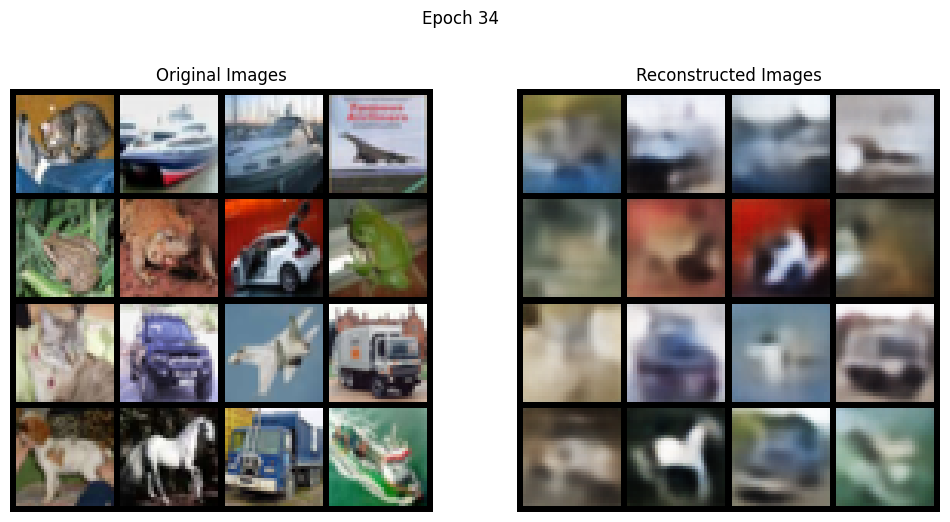

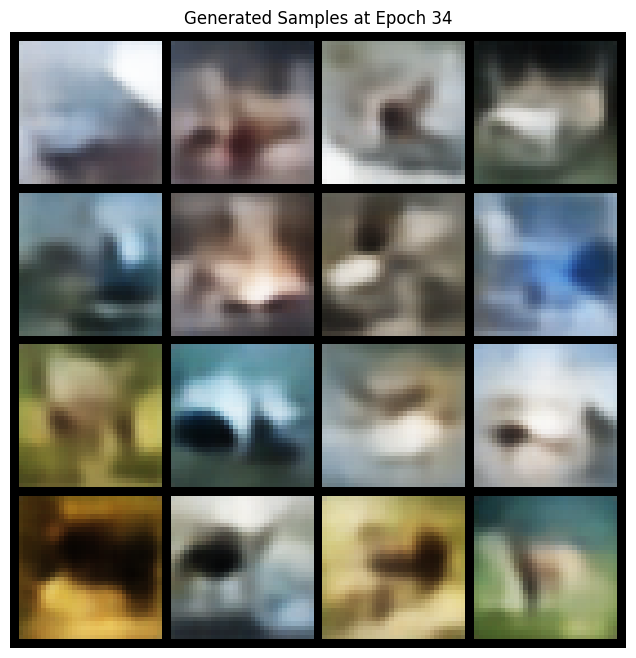

Epoch [35/50], Batch [0/391], Loss: 186.2333
Epoch [35/50], Batch [100/391], Loss: 187.5211
Epoch [35/50], Batch [200/391], Loss: 189.4190
Epoch [35/50], Batch [300/391], Loss: 168.7940
====> Epoch: 35 Average loss: 182.6526, Recon Loss: 117.5331, KLD: 65.1195


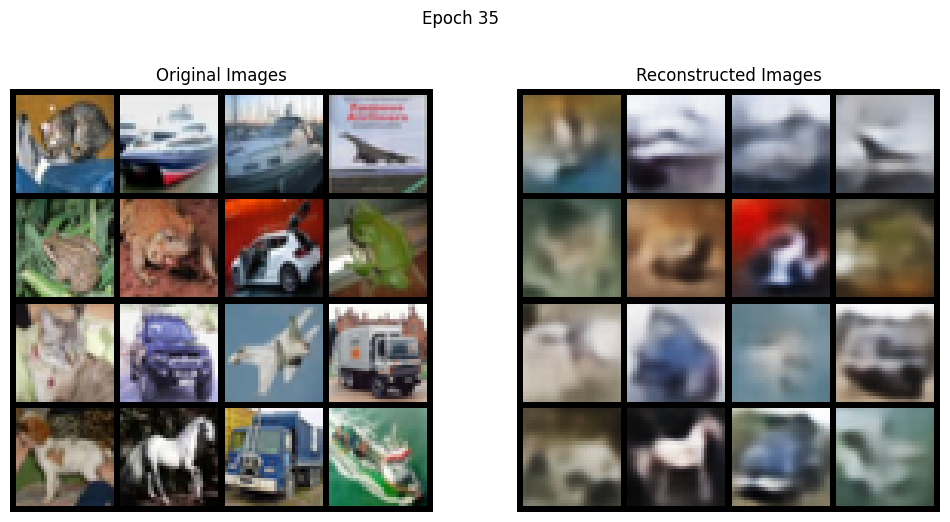

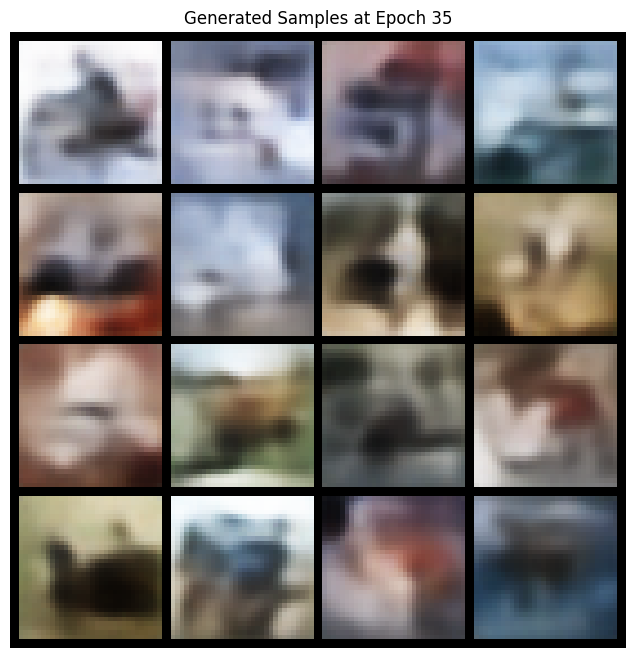

Epoch [36/50], Batch [0/391], Loss: 183.1332
Epoch [36/50], Batch [100/391], Loss: 176.9956
Epoch [36/50], Batch [200/391], Loss: 180.0928
Epoch [36/50], Batch [300/391], Loss: 184.2598
====> Epoch: 36 Average loss: 182.6577, Recon Loss: 117.5189, KLD: 65.1388


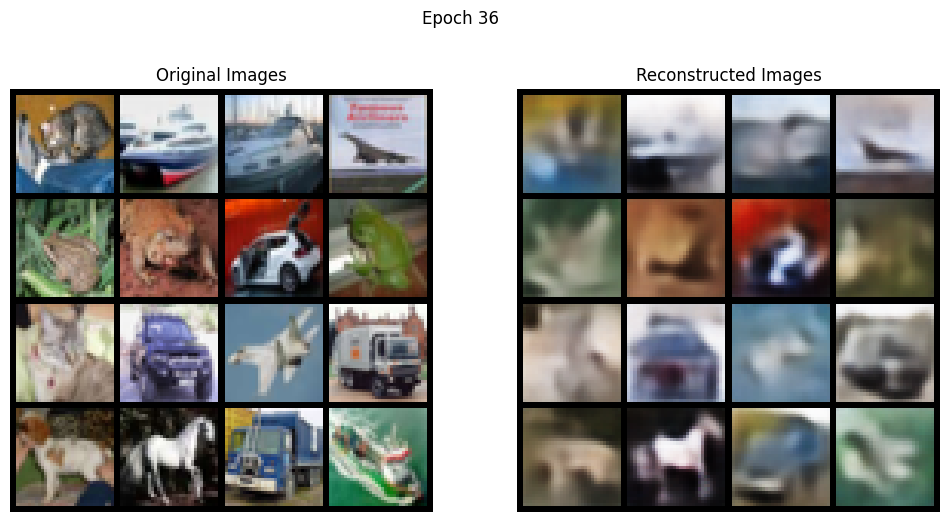

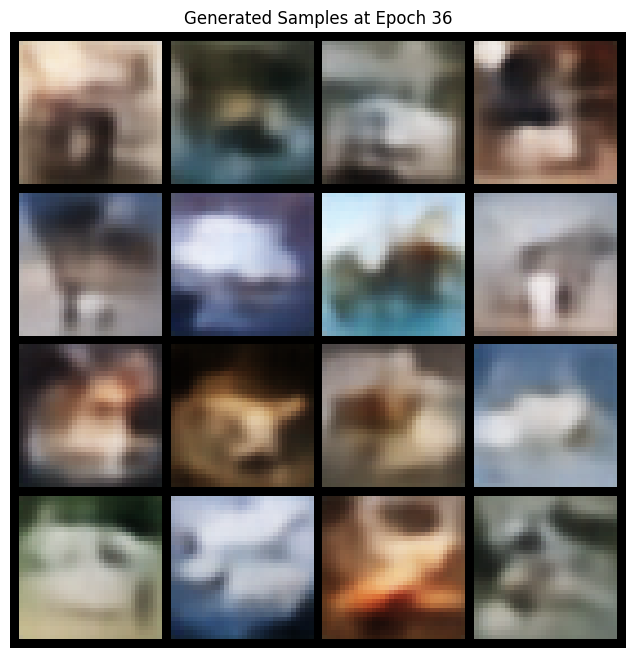

Epoch [37/50], Batch [0/391], Loss: 187.7586
Epoch [37/50], Batch [100/391], Loss: 184.6259
Epoch [37/50], Batch [200/391], Loss: 173.8209
Epoch [37/50], Batch [300/391], Loss: 175.5059
====> Epoch: 37 Average loss: 182.3629, Recon Loss: 117.1662, KLD: 65.1967


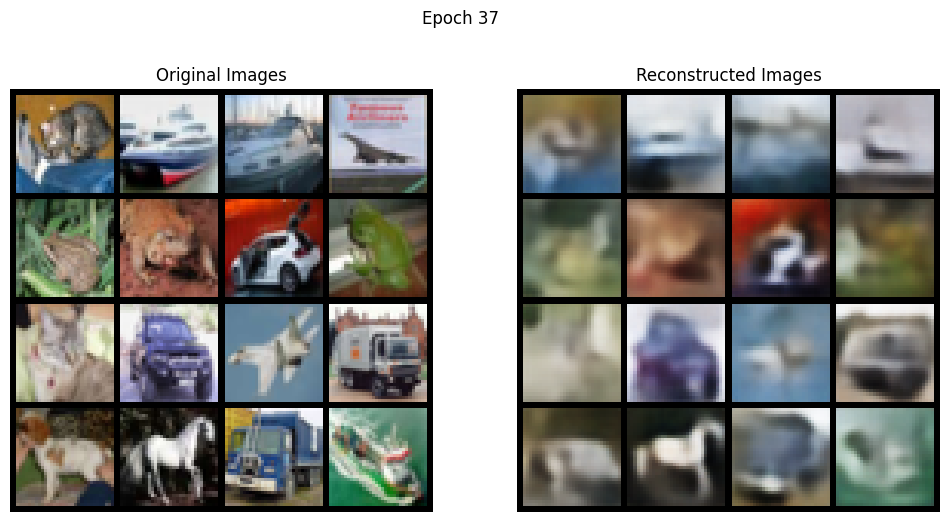

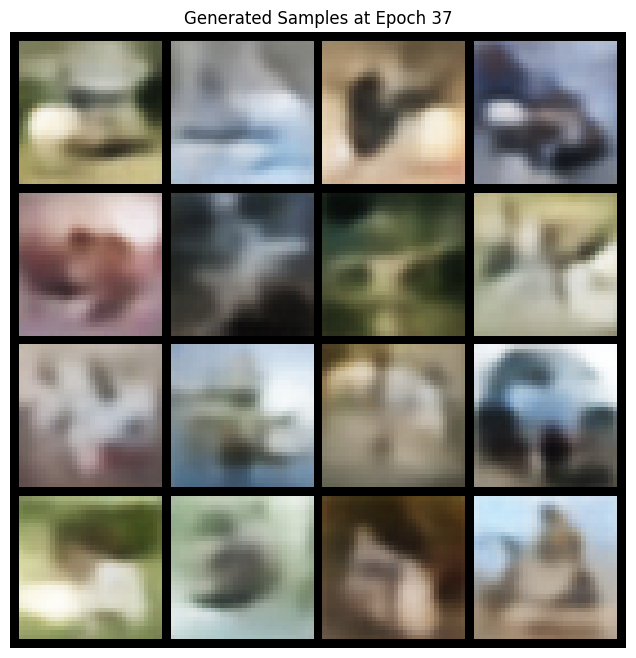

Epoch [38/50], Batch [0/391], Loss: 182.0906
Epoch [38/50], Batch [100/391], Loss: 177.7215
Epoch [38/50], Batch [200/391], Loss: 183.6614
Epoch [38/50], Batch [300/391], Loss: 189.0927
====> Epoch: 38 Average loss: 182.3748, Recon Loss: 117.2232, KLD: 65.1515


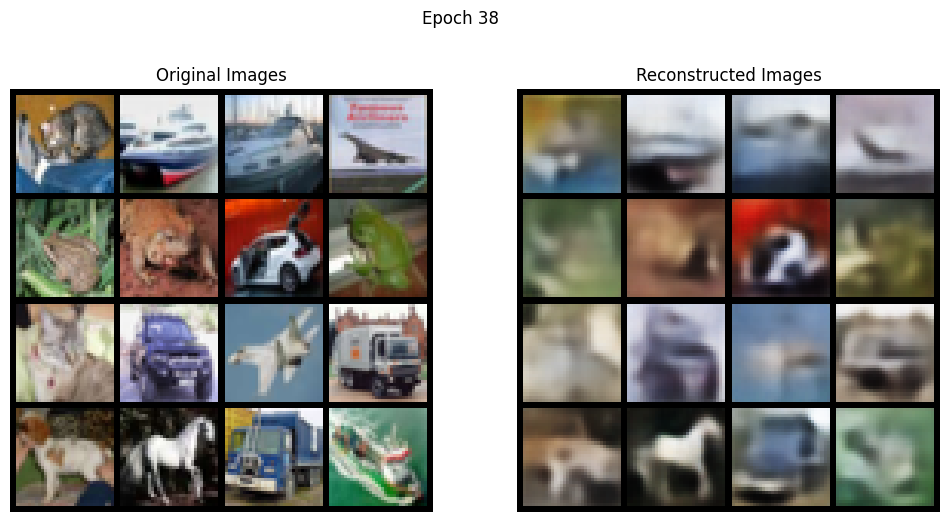

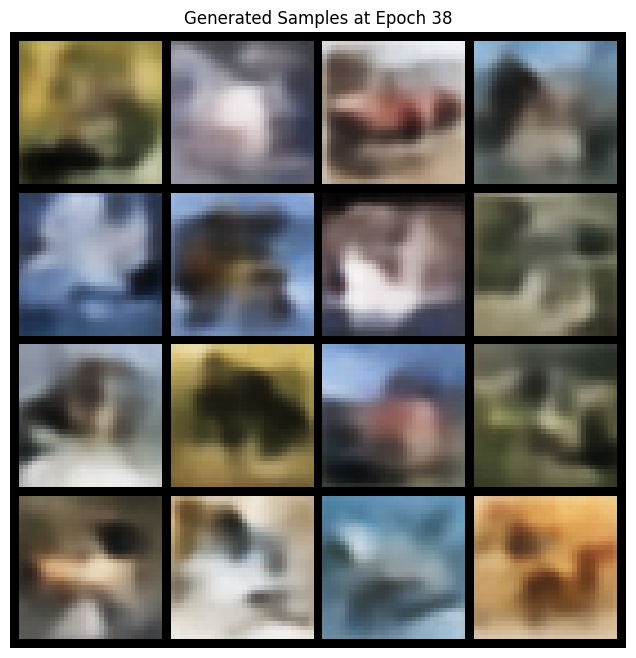

Epoch [39/50], Batch [0/391], Loss: 181.3368
Epoch [39/50], Batch [100/391], Loss: 188.4526
Epoch [39/50], Batch [200/391], Loss: 173.5167
Epoch [39/50], Batch [300/391], Loss: 181.5166
====> Epoch: 39 Average loss: 182.2163, Recon Loss: 116.9422, KLD: 65.2741


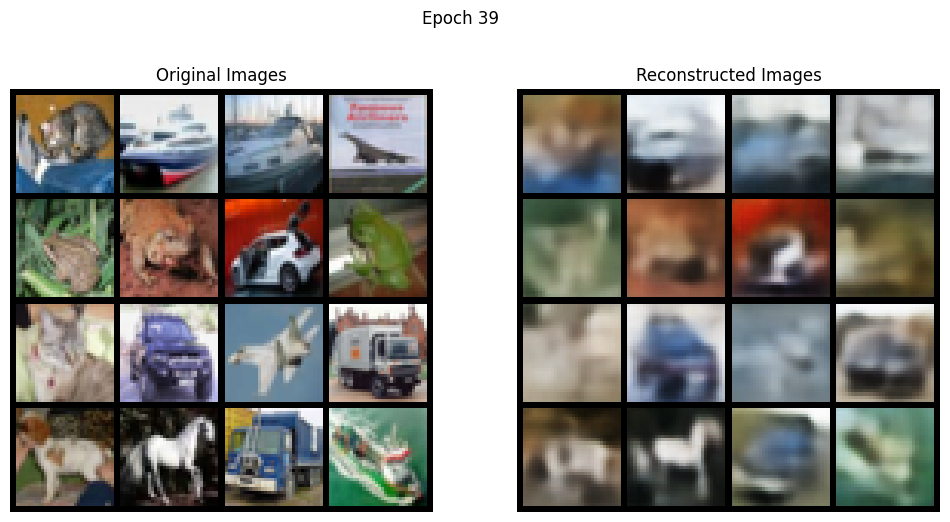

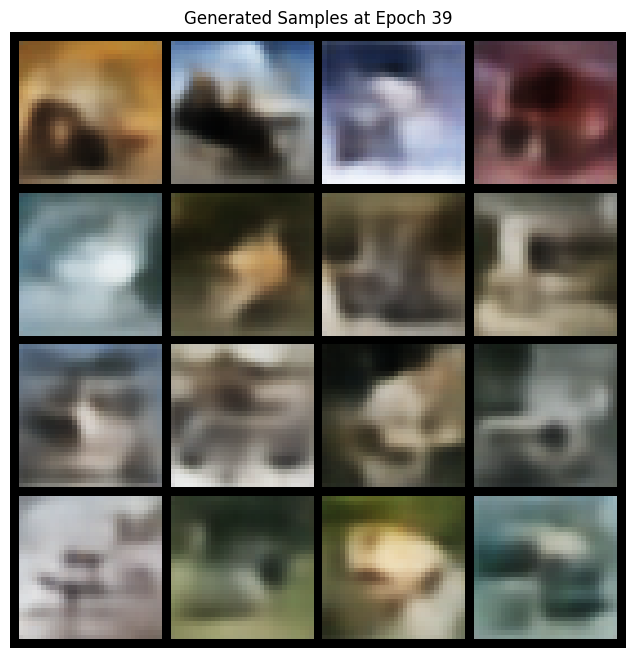

Epoch [40/50], Batch [0/391], Loss: 192.2167
Epoch [40/50], Batch [100/391], Loss: 190.3660
Epoch [40/50], Batch [200/391], Loss: 186.2309
Epoch [40/50], Batch [300/391], Loss: 186.5428
====> Epoch: 40 Average loss: 182.0914, Recon Loss: 116.8266, KLD: 65.2648


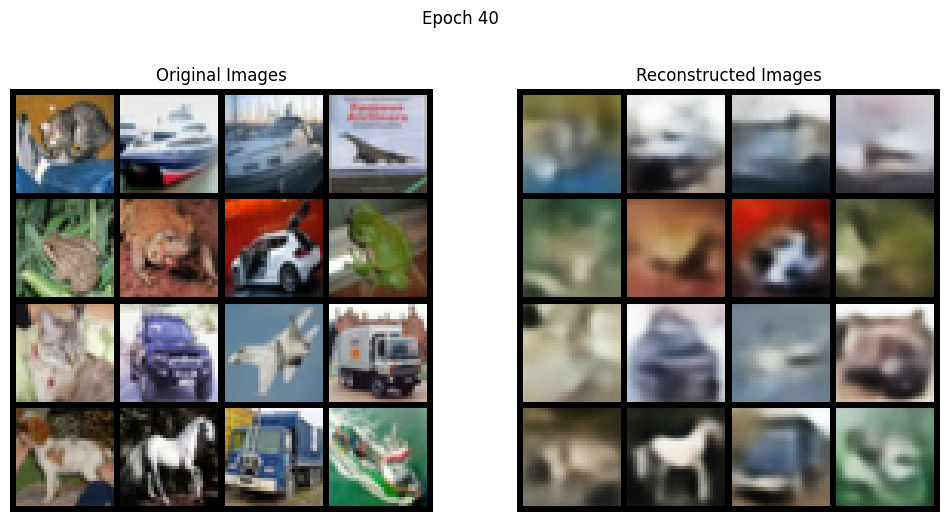

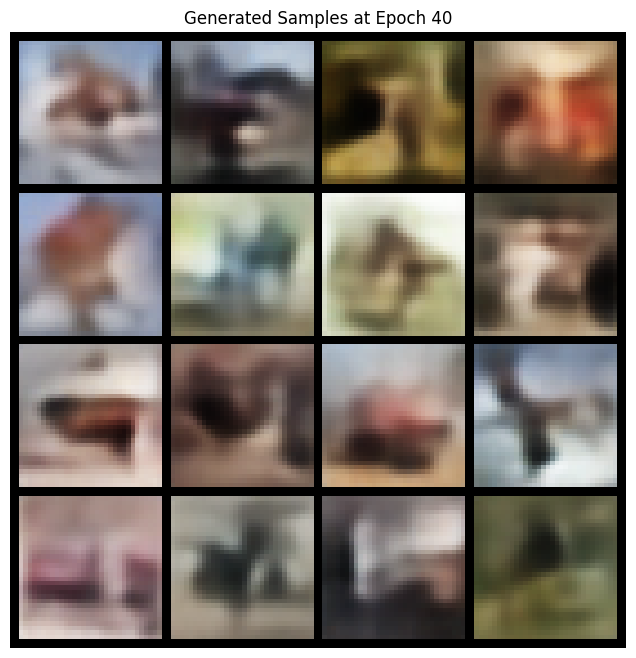

Epoch [41/50], Batch [0/391], Loss: 173.5814
Epoch [41/50], Batch [100/391], Loss: 180.8501
Epoch [41/50], Batch [200/391], Loss: 175.5901
Epoch [41/50], Batch [300/391], Loss: 181.1745
====> Epoch: 41 Average loss: 181.9031, Recon Loss: 116.6634, KLD: 65.2397


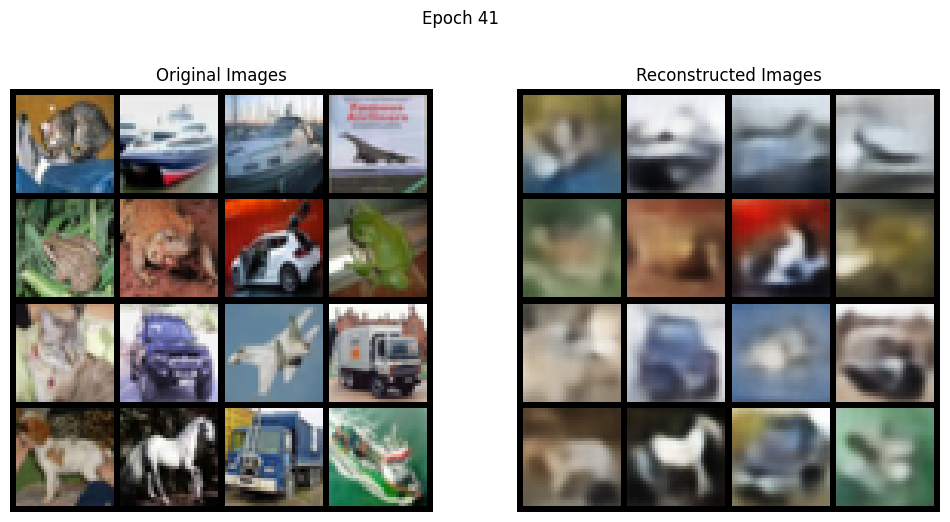

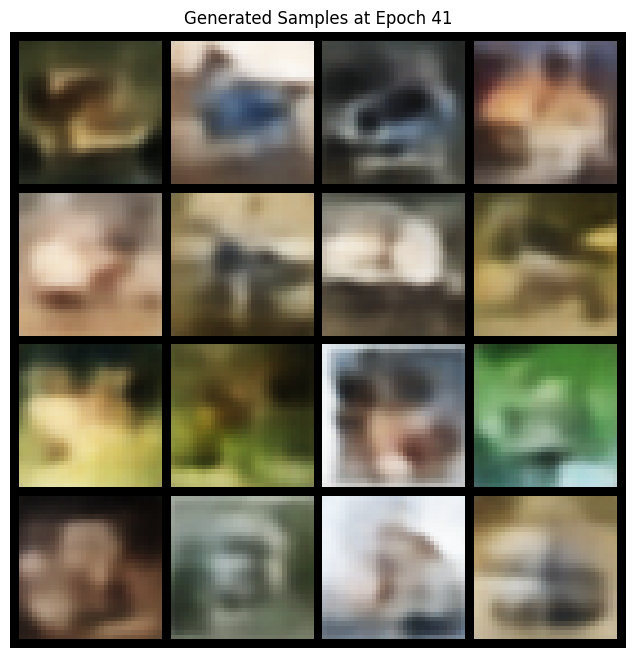

Epoch [42/50], Batch [0/391], Loss: 179.1961
Epoch [42/50], Batch [100/391], Loss: 181.9662
Epoch [42/50], Batch [200/391], Loss: 179.7085
Epoch [42/50], Batch [300/391], Loss: 181.8463
====> Epoch: 42 Average loss: 181.9741, Recon Loss: 116.6347, KLD: 65.3395


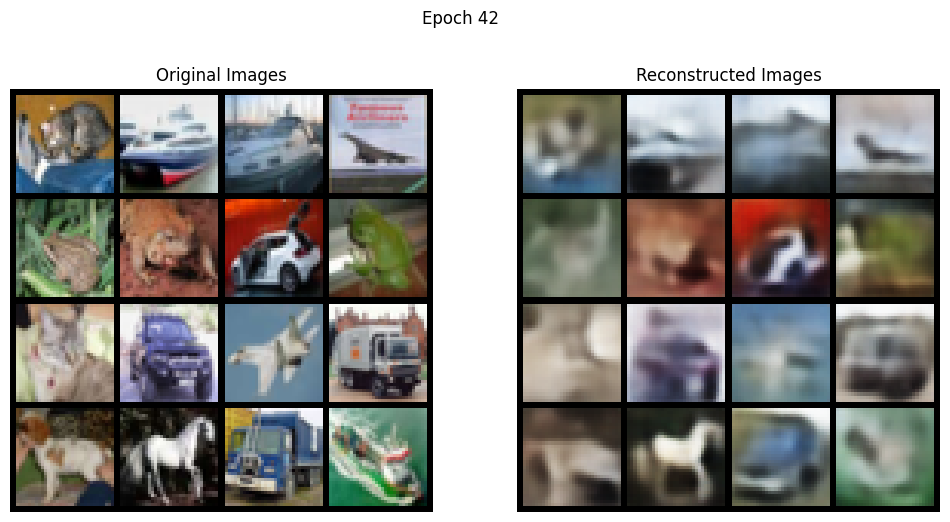

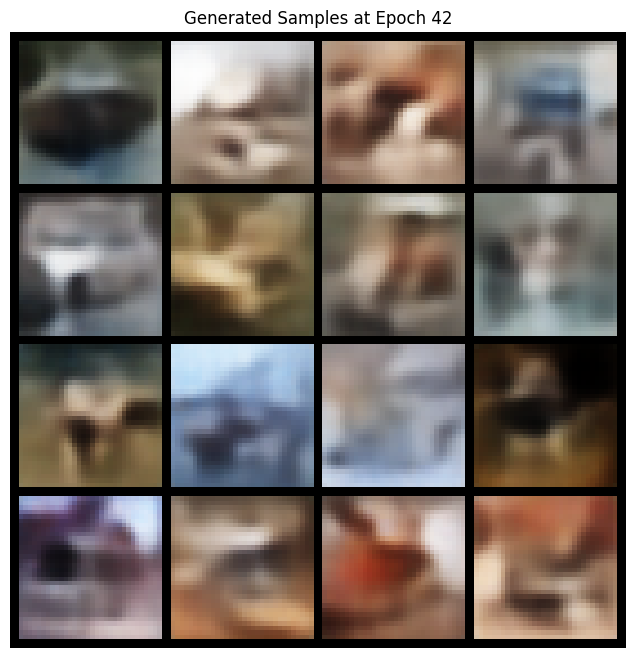

Epoch [43/50], Batch [0/391], Loss: 178.8080
Epoch [43/50], Batch [100/391], Loss: 187.9713
Epoch [43/50], Batch [200/391], Loss: 174.7604
Epoch [43/50], Batch [300/391], Loss: 191.2522
====> Epoch: 43 Average loss: 181.8636, Recon Loss: 116.5829, KLD: 65.2807


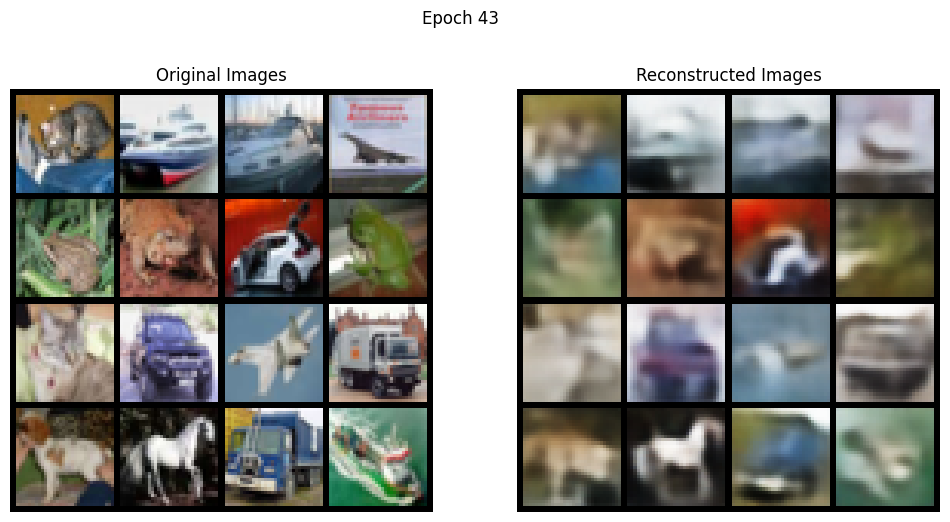

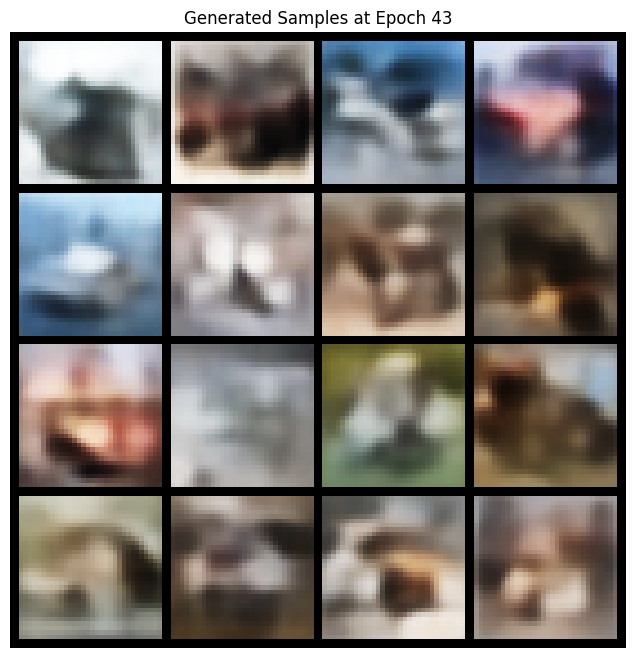

Epoch [44/50], Batch [0/391], Loss: 175.5181
Epoch [44/50], Batch [100/391], Loss: 178.3610
Epoch [44/50], Batch [200/391], Loss: 187.7933
Epoch [44/50], Batch [300/391], Loss: 184.1626
====> Epoch: 44 Average loss: 181.7111, Recon Loss: 116.3947, KLD: 65.3164


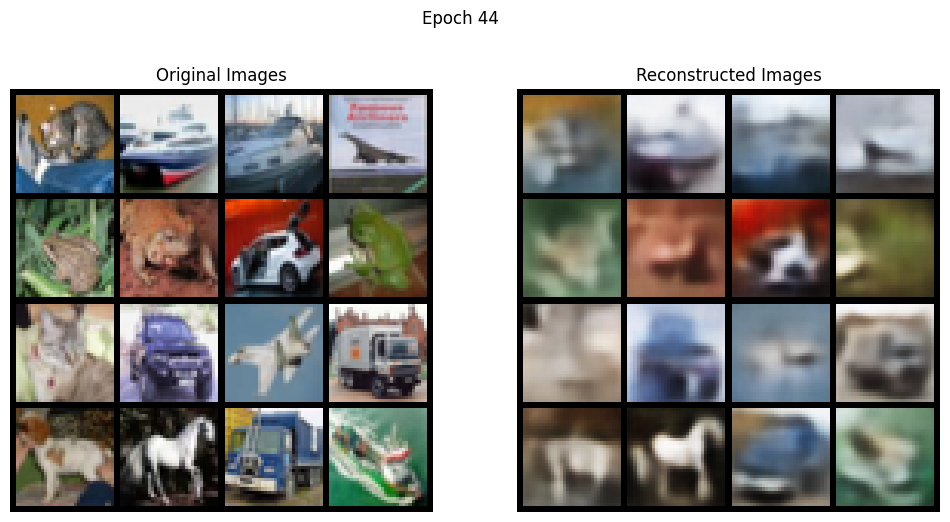

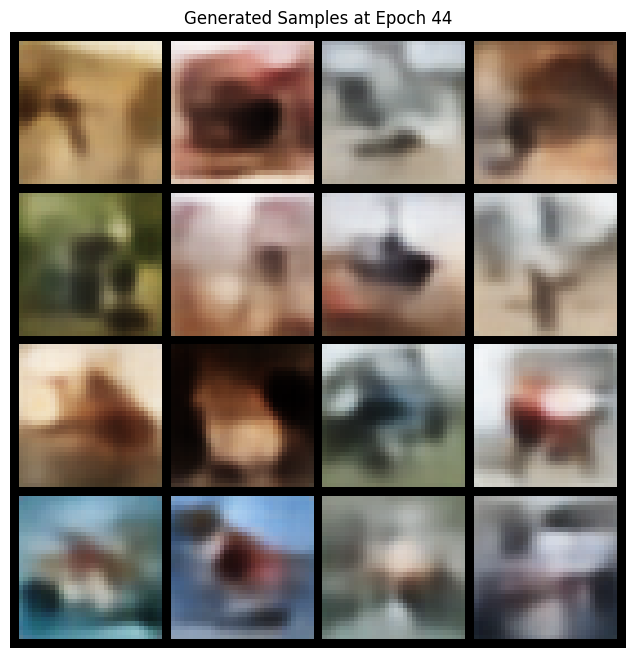

Epoch [45/50], Batch [0/391], Loss: 184.6710
Epoch [45/50], Batch [100/391], Loss: 171.1896
Epoch [45/50], Batch [200/391], Loss: 197.3124
Epoch [45/50], Batch [300/391], Loss: 178.3021
====> Epoch: 45 Average loss: 181.6556, Recon Loss: 116.2538, KLD: 65.4018


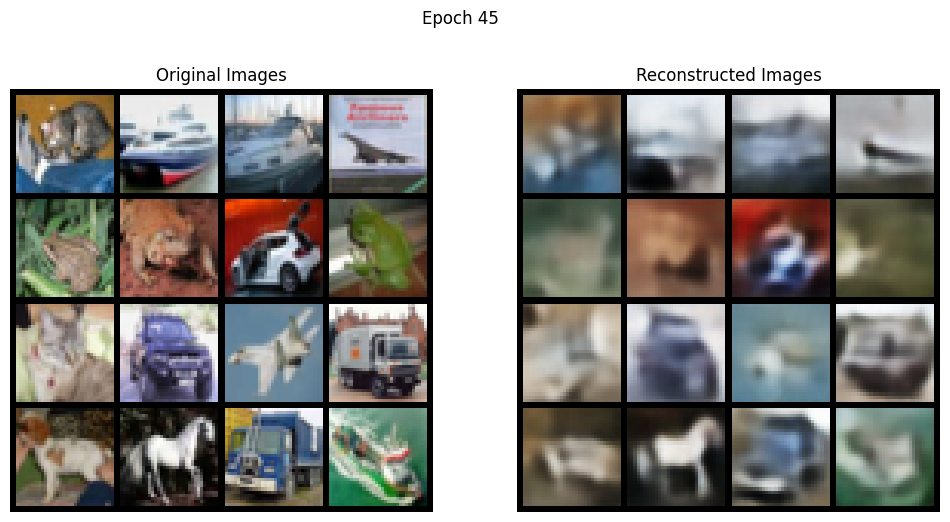

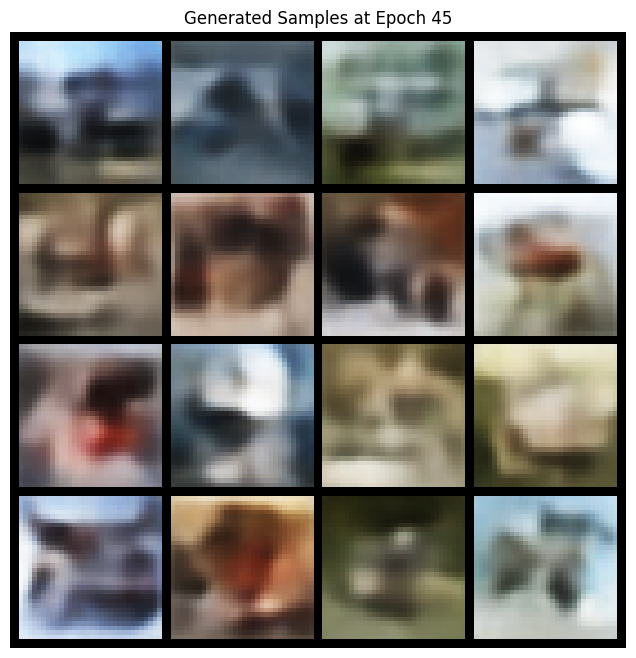

Epoch [46/50], Batch [0/391], Loss: 180.8159
Epoch [46/50], Batch [100/391], Loss: 178.1657
Epoch [46/50], Batch [200/391], Loss: 172.0758
Epoch [46/50], Batch [300/391], Loss: 184.1755
====> Epoch: 46 Average loss: 181.6748, Recon Loss: 116.2746, KLD: 65.4002


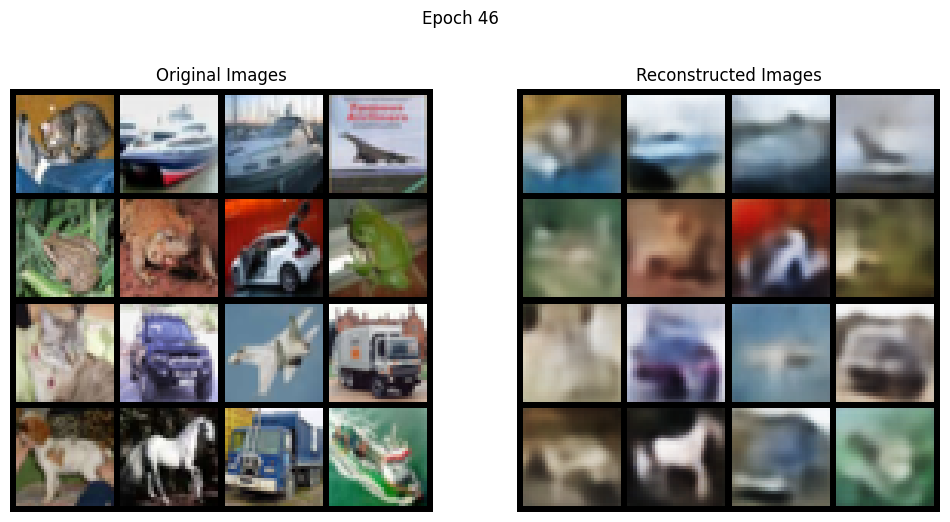

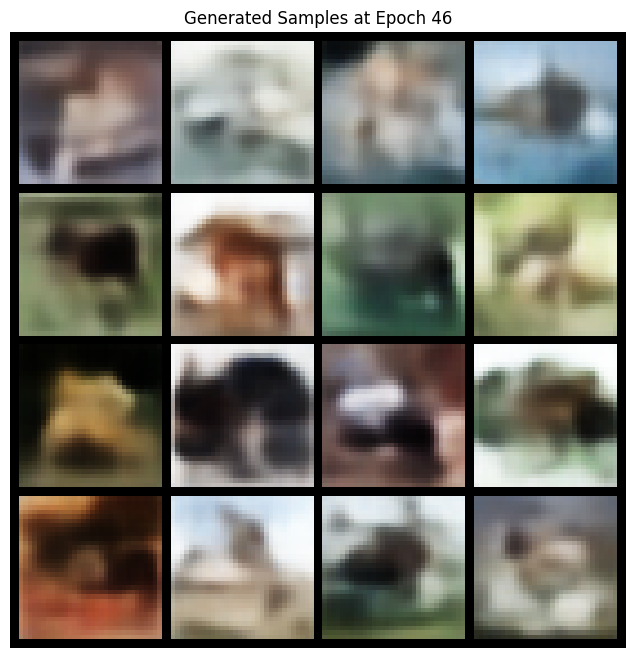

Epoch [47/50], Batch [0/391], Loss: 181.6265
Epoch [47/50], Batch [100/391], Loss: 188.6672
Epoch [47/50], Batch [200/391], Loss: 179.5182
Epoch [47/50], Batch [300/391], Loss: 183.4345
====> Epoch: 47 Average loss: 181.5400, Recon Loss: 116.0982, KLD: 65.4418


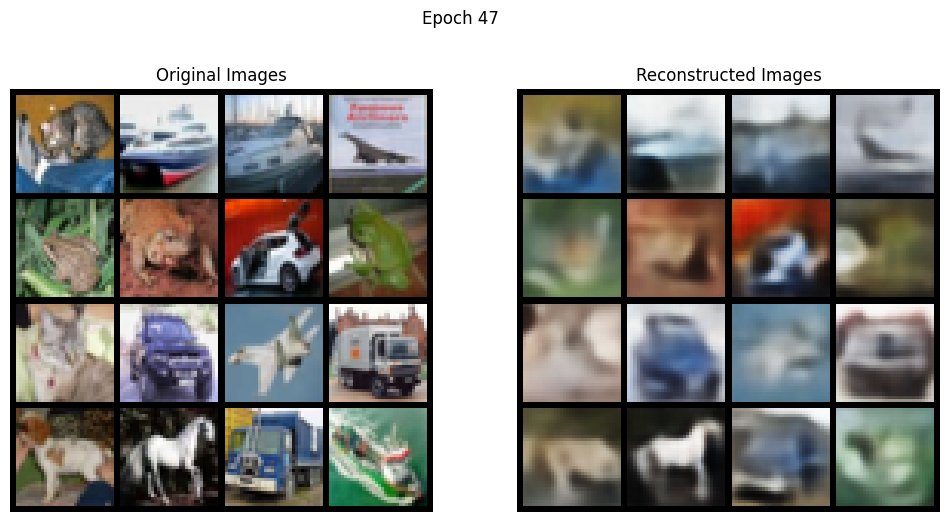

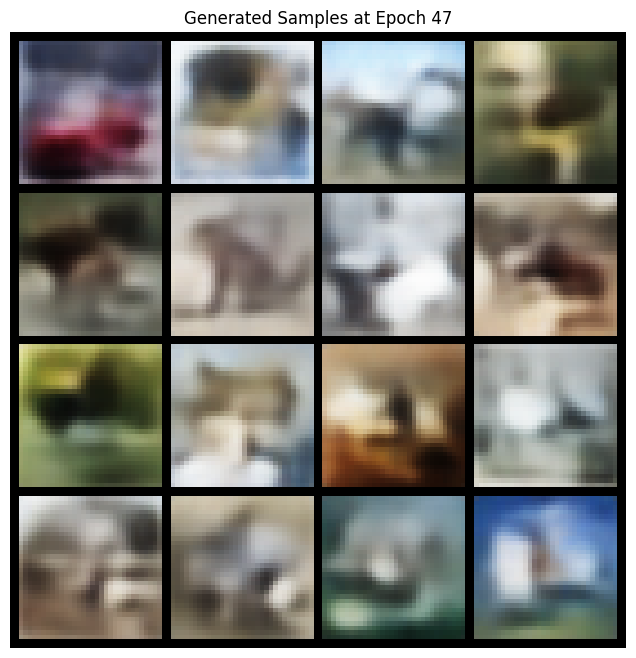

Epoch [48/50], Batch [0/391], Loss: 184.4730
Epoch [48/50], Batch [100/391], Loss: 185.0554
Epoch [48/50], Batch [200/391], Loss: 170.3678
Epoch [48/50], Batch [300/391], Loss: 178.2290
====> Epoch: 48 Average loss: 181.4310, Recon Loss: 116.0412, KLD: 65.3898


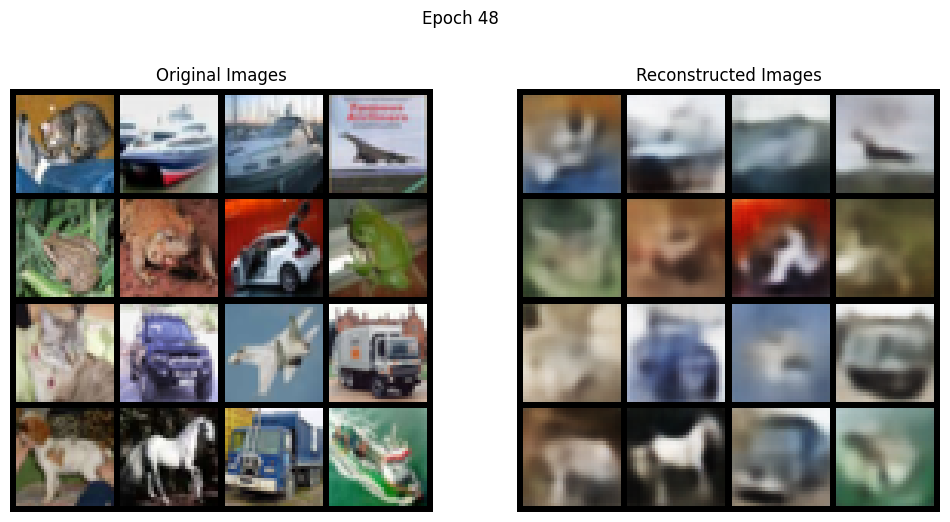

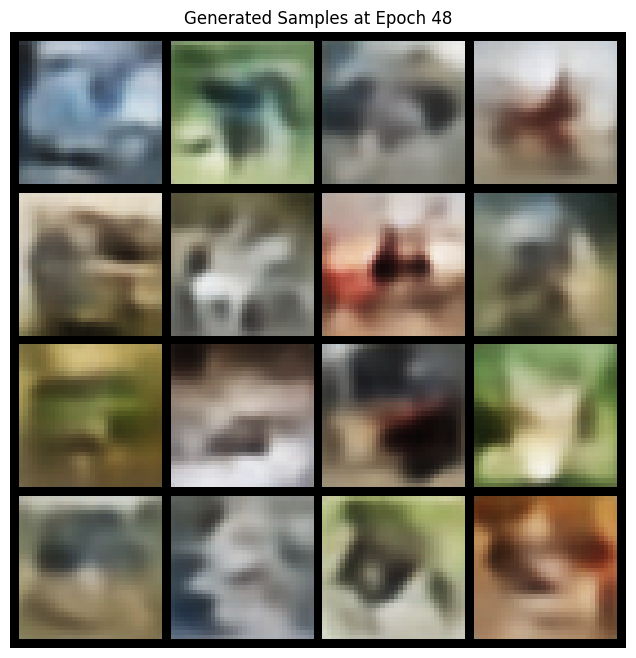

Epoch [49/50], Batch [0/391], Loss: 185.2486
Epoch [49/50], Batch [100/391], Loss: 183.6671
Epoch [49/50], Batch [200/391], Loss: 186.9437
Epoch [49/50], Batch [300/391], Loss: 178.4279
====> Epoch: 49 Average loss: 181.3231, Recon Loss: 115.8136, KLD: 65.5094


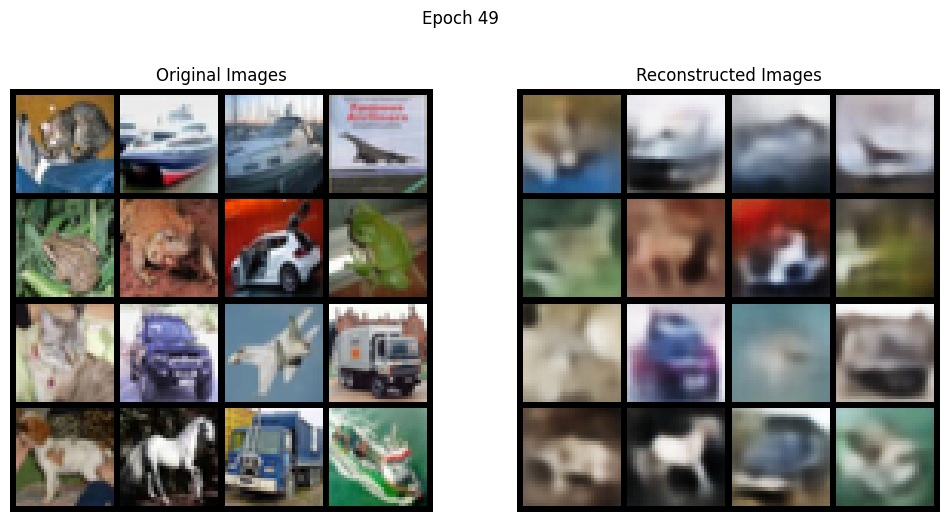

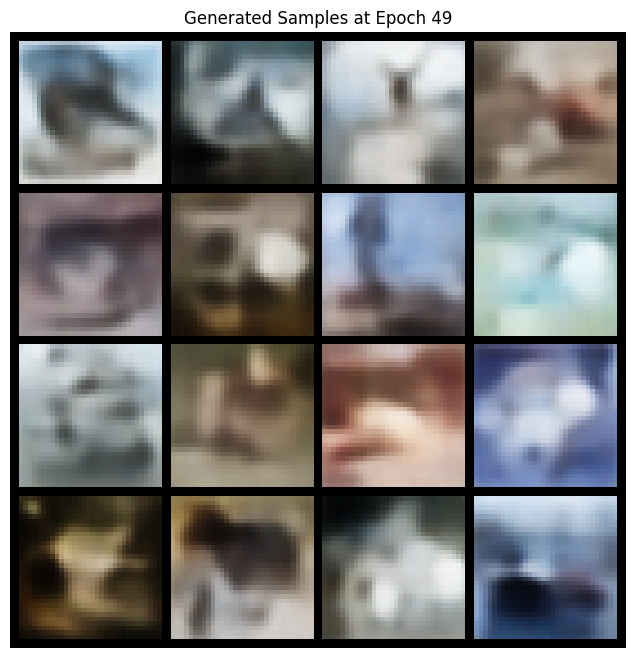

Epoch [50/50], Batch [0/391], Loss: 182.5386
Epoch [50/50], Batch [100/391], Loss: 188.7694
Epoch [50/50], Batch [200/391], Loss: 175.0117
Epoch [50/50], Batch [300/391], Loss: 190.5506
====> Epoch: 50 Average loss: 181.3392, Recon Loss: 115.9111, KLD: 65.4281


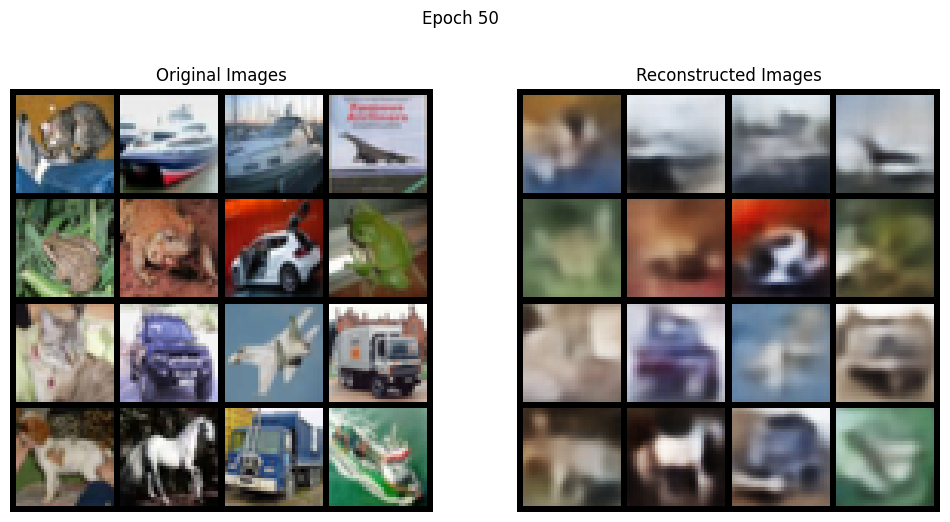

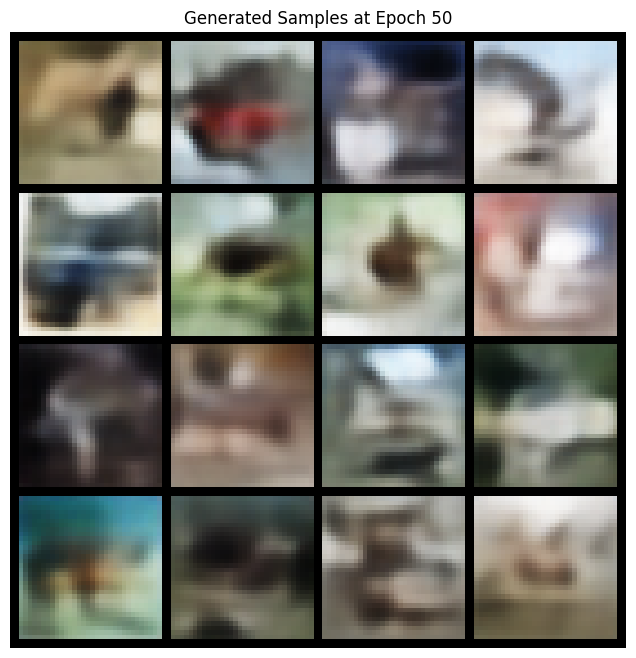

In [17]:
for epoch in range(1, config['num_epochs'] + 1):
    avg_loss, avg_recon, avg_KLD = train_vae(model, train_loader, optimizer, epoch, config)
    loss_history.append(avg_loss)
    recon_history.append(avg_recon)
    KLD_history.append(avg_KLD)

    # Visualize reconstructions on test set
    visualize_reconstructions(model, test_loader, config, epoch, num_images=16)

    # Generate and visualize new samples
    visualize_generated_samples(model, config, epoch, num_samples=16)

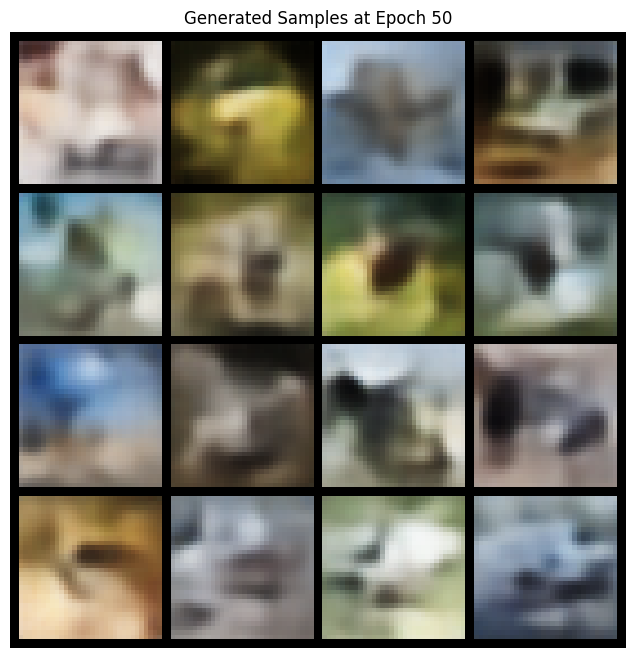

In [18]:
visualize_generated_samples(model, config, epoch, num_samples=16)